## Analysis of Rgl3 signaling network in the developing dopaminergic niche (human)

Luca Fusar Bassini

In [3]:
library(Seurat)
library(dplyr) 
library(Matrix)
library(ggplot2)
library(repr)

options(repr.plot.width=20, repr.plot.height=15)
options(Seurat.object.assay.version = "v5")

In [4]:
# Seurat object from Braun et al 2023 - for general Seurat object preparation & deep comments see correspondent mouse script.

so = readRDS("so_human_emilia.rds")

so

An object of class Seurat 
59480 features across 12749 samples within 1 assay 
Active assay: RNA (59480 features, 2000 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, umap

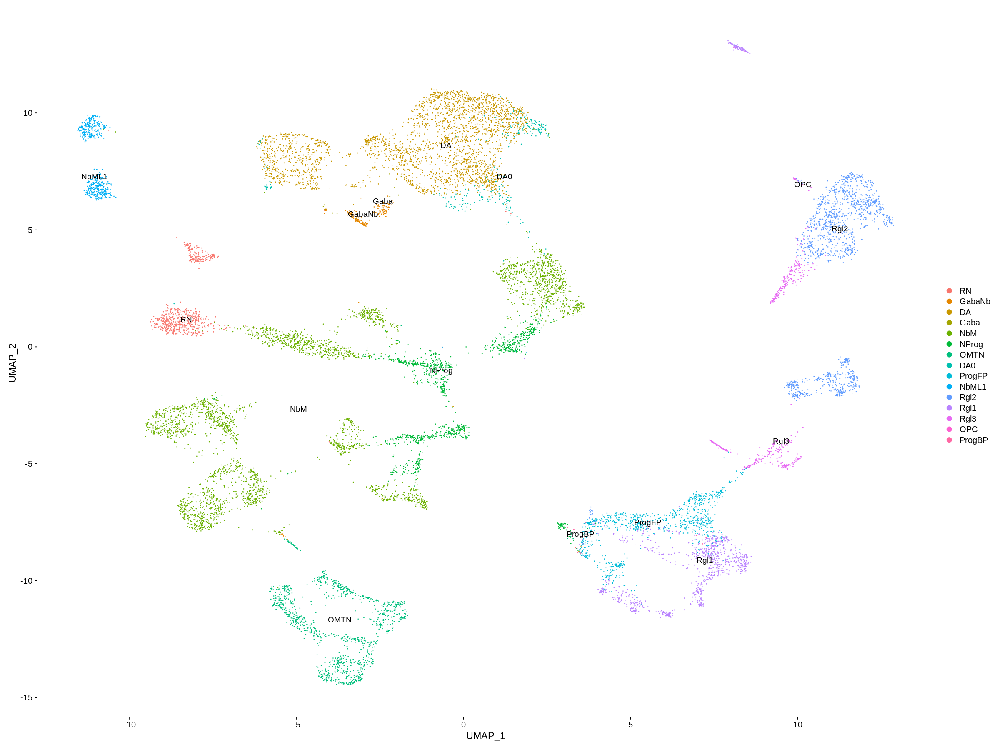

In [5]:
Idents(so) = "celltype"
DimPlot(so, reduction = 'umap', label = TRUE)

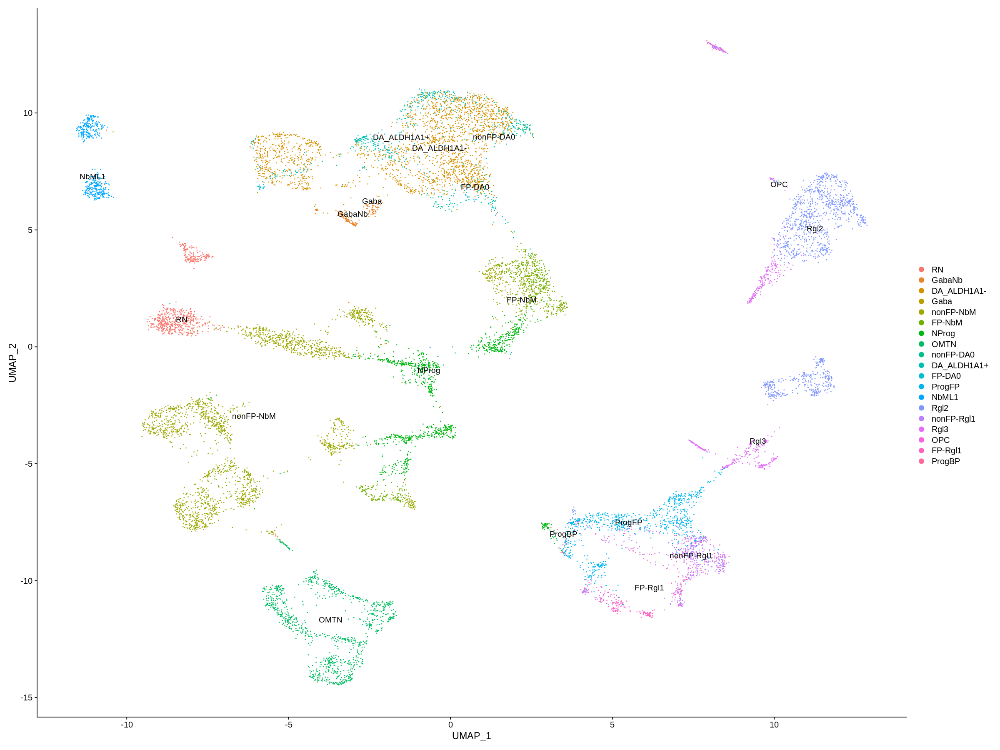

In [6]:
# annotating fine-grained subtypes to highlight those in the floor plate

so_rgl1 = subset(so, idents="Rgl1")
so_nbm = subset(so, idents="NbM")
so_da0 = subset(so, idents="DA0")
so_da = subset(so, idents="DA")

positive_genes <- c("LMX1A", "FOXA2", "EN1")
negative_genes <- c("PITX2", "NKX6-1", "NKX6-2", "NKX2-2")

data <- as.data.frame(so_rgl1[["RNA"]]@data[c(positive_genes, negative_genes), ])
data <- data.frame(t(data))

data[,4:7] = - data[,4:7]

data$sum = rowSums(data)

so_rgl1 <- AddMetaData(object = so_rgl1, metadata = data, col.name = "sum")

data$choice = data$sum > 2.5

data$celltype = "FP-Rgl1"
data$celltype[!data$choice] = "nonFP-Rgl1"

celltypes = data.frame(cbind(Cells(so), as.character(Idents(so))))
colnames(celltypes) = c("cell", "celltype")
rownames(celltypes) = celltypes$cell

data$cell = rownames(data)
data = data %>% dplyr::select(cell, celltype)

celltypes = celltypes[!rownames(celltypes) %in% data$cell,]
celltypes = data.frame(rbind(celltypes, data))

so_rgl1 <- AddMetaData(object = so_rgl1, metadata = data, col.name = "celltype")

positive_genes <- c("LMX1A", "FOXA2", "EN1")
negative_genes <- c("PITX2", "NKX6-1", "NKX6-2", "NKX2-2")
data <- as.data.frame(so_nbm[["RNA"]]@data[c(positive_genes, negative_genes), ])
data <- data.frame(t(data))
data[,4:7] = - data[,4:7]
data$sum = rowSums(data)
so_nbm <- AddMetaData(object = so_nbm, metadata = data, col.name = "sum")
data$choice = data$sum > 1.5
data$celltype = "FP-NbM"
data$celltype[!data$choice] = "nonFP-NbM"
data$cell = rownames(data)
data = data %>% dplyr::select(cell, celltype)
celltypes = celltypes[!rownames(celltypes) %in% data$cell,]
celltypes = data.frame(rbind(celltypes, data))
so_nbm <- AddMetaData(object = so_nbm, metadata = data, col.name = "celltype")

positive_genes <- c("LMX1A", "FOXA2", "EN1")
negative_genes <- c("PITX2", "NKX6-1", "NKX6-2", "NKX2-2")
data <- as.data.frame(so_da0[["RNA"]]@data[c(positive_genes, negative_genes), ])
data <- data.frame(t(data))
data[,4:7] = - data[,4:7]
data$sum = rowSums(data)
data$choice = data$sum > 3
data$celltype = "FP-DA0"
data$celltype[!data$choice] = "nonFP-DA0"
data$cell = rownames(data)
data = data %>% dplyr::select(cell, celltype)
celltypes = celltypes[!rownames(celltypes) %in% data$cell,]
celltypes = data.frame(rbind(celltypes, data))
so_da0 <- AddMetaData(object = so_da0, metadata = data, col.name = "celltype")

genes <- c("ALDH1A1")
data <- as.data.frame(so_da[["RNA"]]@data["ALDH1A1", ])
colnames(data) = genes
subdata <- rownames(data)[data$ALDH1A1 > 1]
subdata2 = rownames(data)[data$ALDH1A1 < 2]
celltypes$celltype[rownames(celltypes) %in% subdata] = "DA_ALDH1A1+"
celltypes$celltype[rownames(celltypes) %in% subdata2] = "DA_ALDH1A1-"

so <- AddMetaData(object = so, metadata = celltypes, col.name = "celltype")
Idents(so) = "celltype"
DimPlot(so, reduction = 'umap', label = TRUE)

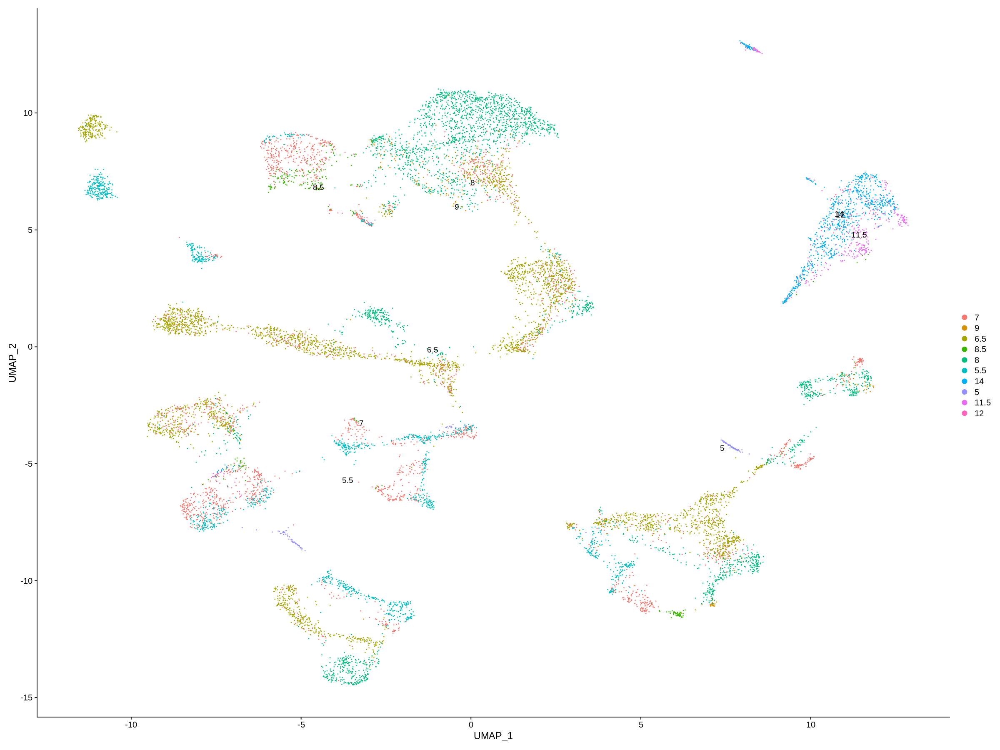

In [8]:
age = read.delim("age_human_emiliadataset.txt") ## metadata from Braun et al

rownames(age) = paste0("X", rownames(age))

rownames(age) <- gsub(":", ".", rownames(age))
age = age[rownames(age) %in% Cells(so),]
age$age[age$age > 6.89 & age$age < 6.91] = 7
age$age[age$age > 9.18 & age$age < 9.21] = 9
age$age[age$age > 6.45 & age$age < 6.7] = 6.5

so = AddMetaData(object = so, metadata = age, col.name = "age")

Idents(so) <- 'age'
DimPlot(so, reduction = 'umap', label = TRUE)

In [9]:
library(Seurat)
library(ggplot2)
library(patchwork)

Idents(so) <- 'celltype'
p1 <- DimPlot(so, reduction = 'umap', label = TRUE, pt.size = 1, label.size = 12) + 
      theme_void() + 
      scale_size(range = c(3, 3)) +
      theme(
        text = element_text(size = 10)
      )

Idents(so) <- 'age'
p2 <- DimPlot(so, reduction = 'umap', label = TRUE, pt.size = 1, label.size = 12) + 
      theme_void() + 
      scale_size(range = c(3, 3)) +
      theme(
        text = element_text(size = 10)
      )

pdf("h_age.pdf", width = 28, height = 18)
p1+p2
dev.off()

png 
  2

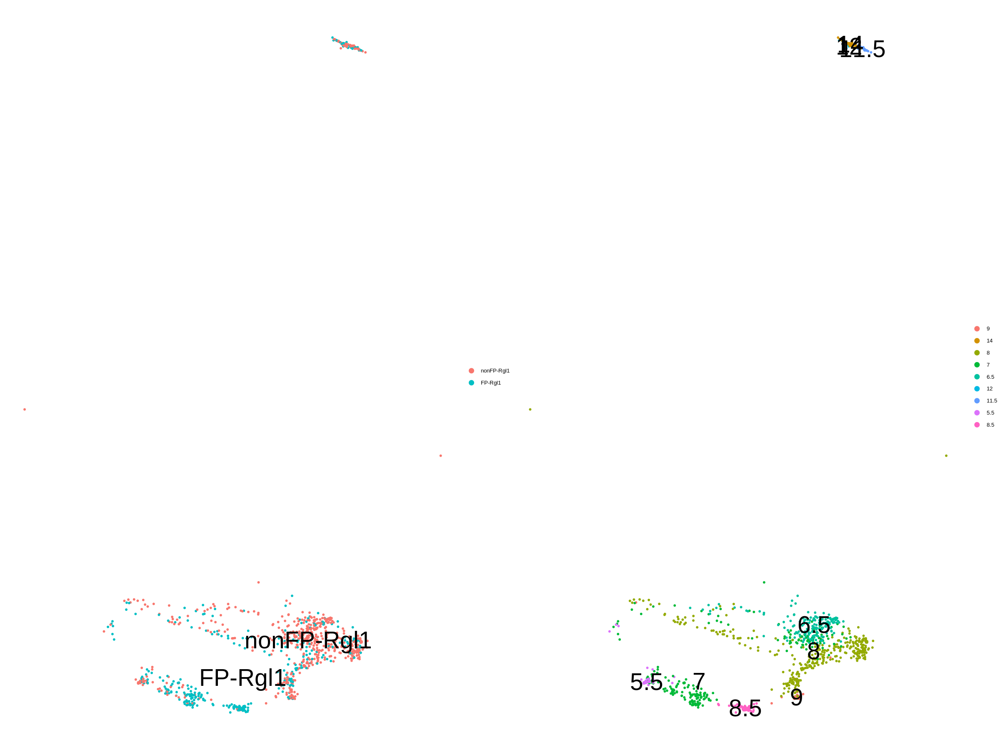

In [10]:
library(Seurat)
library(ggplot2)
library(patchwork)

Idents(so) <- 'celltype'
rgl1 = subset(so, idents = c("FP-Rgl1", "nonFP-Rgl1"))

Idents(rgl1) <- 'celltype'
p1 <- DimPlot(rgl1, reduction = 'umap', label = TRUE, pt.size = 1, label.size = 12) + 
      theme_void() + 
      scale_size(range = c(3, 3)) +
      theme(
        text = element_text(size = 10)
      )

Idents(rgl1) <- 'age'
p2 <- DimPlot(rgl1, reduction = 'umap', label = TRUE, pt.size = 1, label.size = 12) + 
      theme_void() + 
      scale_size(range = c(3, 3)) +
      theme(
        text = element_text(size = 10)
      )

#pdf("h_age_rgl1.pdf", width = 28, height = 18)
p1+p2
#dev.off()

In [11]:
Idents(rgl1) <- 'age'
tab = table(Idents(rgl1))
tab_sorted <- tab[order(as.numeric(names(tab)))]
tab_sorted


 5.5  6.5    7    8  8.5    9 11.5   12   14 
  27  177  224  329   51   30   27   11   43 

In [12]:
meta = as.data.frame(tab_sorted)
colnames(meta) = c("Stage", "Count")

meta$Stage <- factor(meta$Stage, levels = meta$Stage)

p <- ggplot(meta, aes(x = "", y = Count, fill = Stage)) +
  geom_bar(stat = "identity", width = 1) +
  coord_polar("y", start = 0) +
  theme_void() +
  theme(legend.title = element_blank(),
        legend.text = element_text(size = 45),
        legend.key.size = unit(1.5, "lines")) +
  labs(title = "Distribution of Values", x = "", y = "") +
  scale_fill_brewer(palette = "Set3")

ggsave("pie_chart_rgl1_human.pdf", plot = p, width = 8, height = 6)


 5.5  6.5    7    8  8.5    9 11.5   12   14 
   7   22  134   97   48    5    9    5   14 

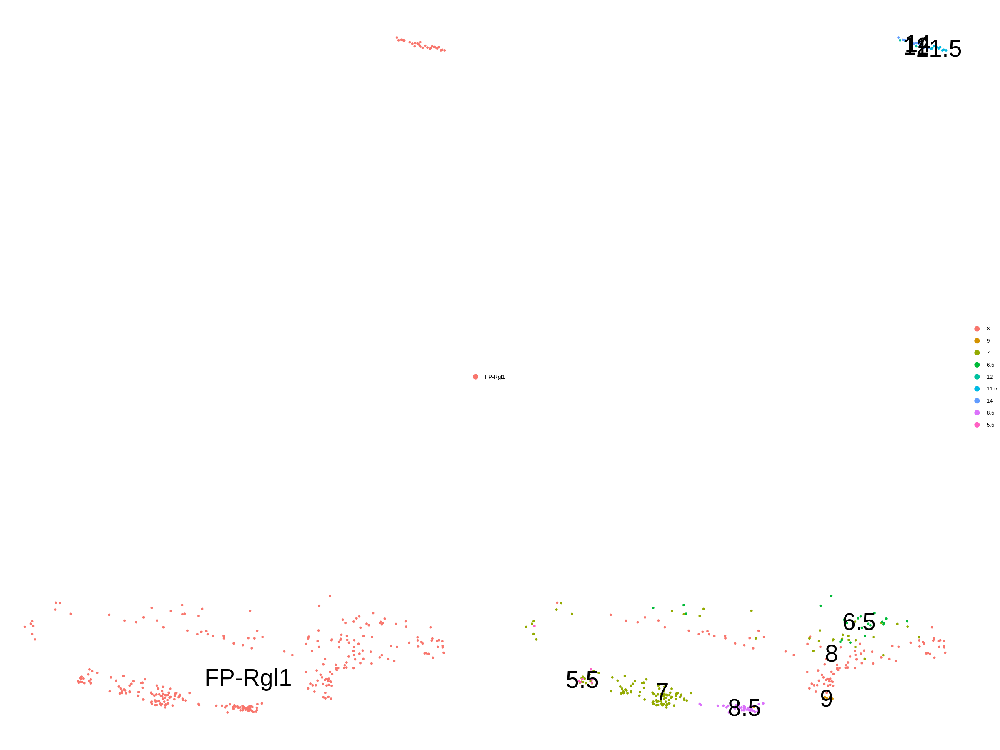

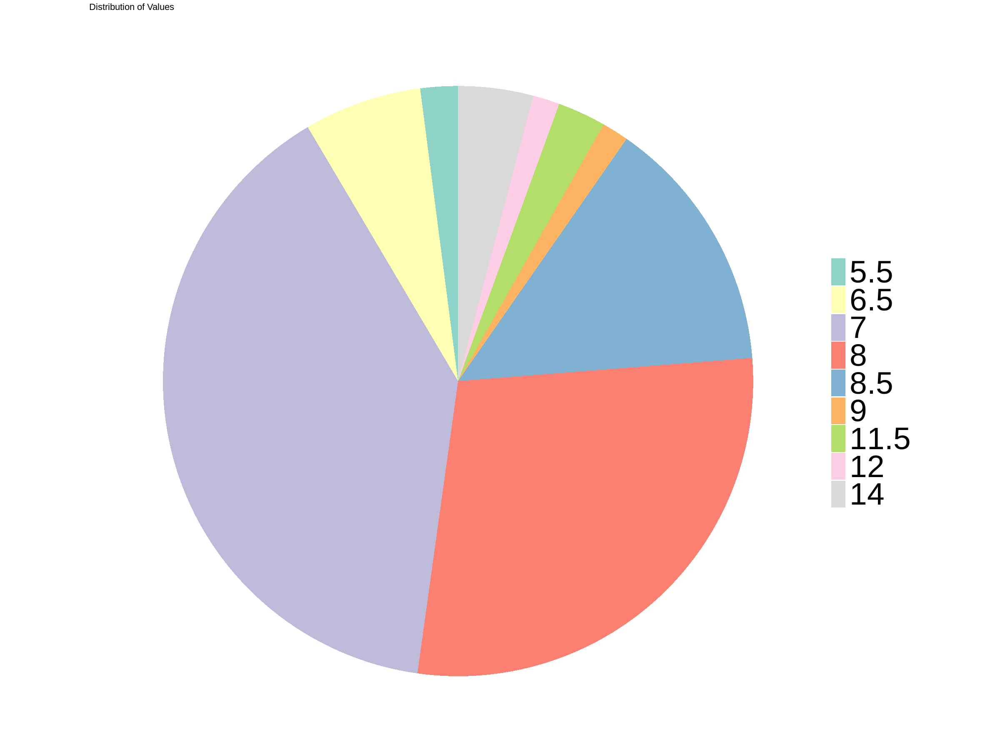

In [13]:
library(Seurat)
library(ggplot2)
library(patchwork)

Idents(so) <- 'celltype'
rgl1 = subset(so, idents = c("FP-Rgl1"))#, "nonFP-Rgl1"

Idents(rgl1) <- 'celltype'
p1 <- DimPlot(rgl1, reduction = 'umap', label = TRUE, pt.size = 1, label.size = 12) + 
      theme_void() + 
      scale_size(range = c(3, 3)) +
      theme(
        text = element_text(size = 10)
      )

Idents(rgl1) <- 'age'
p2 <- DimPlot(rgl1, reduction = 'umap', label = TRUE, pt.size = 1, label.size = 12) + 
      theme_void() + 
      scale_size(range = c(3, 3)) +
      theme(
        text = element_text(size = 10)
      )

#pdf("h_age_rgl1.pdf", width = 28, height = 18)
p1+p2
#dev.off()

Idents(rgl1) <- 'age'
tab = table(Idents(rgl1))
tab_sorted <- tab[order(as.numeric(names(tab)))]
tab_sorted

meta = as.data.frame(tab_sorted)
colnames(meta) = c("Stage", "Count")

meta$Stage <- factor(meta$Stage, levels = meta$Stage)

p <- ggplot(meta, aes(x = "", y = Count, fill = Stage)) +
  geom_bar(stat = "identity", width = 1) +
  coord_polar("y", start = 0) +
  theme_void() +
  theme(legend.title = element_blank(),
        legend.text = element_text(size = 45),
        legend.key.size = unit(1.5, "lines")) +
  labs(title = "Distribution of Values", x = "", y = "") +
  scale_fill_brewer(palette = "Set3")

ggsave("pie_chart_FPrgl1_human.pdf", plot = p, width = 8, height = 6)

p

In [41]:
library(CellChat)

#so = readRDS("so_human_emilia2.rds")

# CellChat object inheriting the Seurat object
cellchat <- createCellChat(so, group.by="celltype") 

# extending the CellChat database - NOTE: the extended database can be created step-wise with the code in the accompanying "mouse" script and "forcing" gene names mouse -> human
CellChatDB <- CellChatDB.human
celltalk_cellphone = read.delim("celltalkdb_cellphonedb_harmonized_for_cellchat_HUMAN24082023LFB.txt")
celltalk_cellphone

[1] "Create a CellChat object from a Seurat object"
The `data` slot in the default assay is used. The default assay is RNA 
The `meta.data` slot in the Seurat object is used as cell meta information 
Set cell identities for the new CellChat object 
The cell groups used for CellChat analysis are  DA_ALDH1A1- DA_ALDH1A1+ FP-DA0 FP-NbM FP-Rgl1 Gaba GabaNb NbML1 nonFP-DA0 nonFP-NbM nonFP-Rgl1 NProg OMTN OPC ProgBP ProgFP Rgl2 Rgl3 RN 


,interaction_name,pathway_name,ligand,receptor,agonist,antagonist,co_A_receptor,co_I_receptor,evidence,annotation,interaction_name_2
,<chr>,<chr>,<chr>,<chr>,<lgl>,<lgl>,<lgl>,<lgl>,<chr>,<lgl>,<chr>
A2M_LRP1,A2M_LRP1,A2M,A2M,LRP1,NA,NA,NA,NA,celltalkdb_10652313,NA,A2M_LRP1
A4_FPR2,A4_FPR2,A4,A4,FPR2,NA,NA,NA,NA,cellphonedb_reactome,NA,A4_FPR2
A4_HG2A,A4_HG2A,A4,A4,HG2A,NA,NA,NA,NA,cellphonedb_PMID:19849849,NA,A4_HG2A
A4_PLXA4,A4_PLXA4,A4,A4,PLXA4,NA,NA,NA,NA,cellphonedb_Shilts screen - VALIDATED,NA,A4_PLXA4
A4_SORL,A4_SORL,A4,A4,SORL,NA,NA,NA,NA,cellphonedb_uniprot,NA,A4_SORL
A4_TNR21,A4_TNR21,A4,A4,TNR21,NA,NA,NA,NA,cellphonedb_uniprot,NA,A4_TNR21
AA1R_ENTP1,AA1R_ENTP1,AA1R,AA1R,ENTP1,NA,NA,NA,NA,cellphonedb_uniprot,NA,AA1R_ENTP1
AA2AR_ENTP1,AA2AR_ENTP1,AA2AR,AA2AR,ENTP1,NA,NA,NA,NA,cellphonedb_uniprot,NA,AA2AR_ENTP1
AA2BR_ENTP1,AA2BR_ENTP1,AA2BR,AA2BR,ENTP1,NA,NA,NA,NA,cellphonedb_uniprot,NA,AA2BR_ENTP1


In [42]:
# correcting relevant gene <-> protein names
ppg = read.table("protein_converted_interactions.txt")
for(i in 1:nrow(celltalk_cellphone)) {
  
  matching_index <- which(ppg$V1 == celltalk_cellphone$ligand[i])

  if(length(matching_index) == 1) {
    celltalk_cellphone$ligand[i] <- ppg$V3[matching_index]
    celltalk_cellphone$pathway_name[i] <- ppg$V3[matching_index]
  }
}

for(i in 1:nrow(celltalk_cellphone)) {
  
  matching_index <- which(ppg$V1 == celltalk_cellphone$receptor[i])

  if(length(matching_index) == 1) {
    celltalk_cellphone$receptor[i] <- ppg$V3[matching_index]
    celltalk_cellphone$interaction_name[i] = paste0(celltalk_cellphone$ligand[i], "_", celltalk_cellphone$receptor[i])
    try({rownames(celltalk_cellphone)[i] = celltalk_cellphone$interaction_name[i]})
  }
}


Warning message:
"non-unique value when setting 'row.names': 'LRPAP1_SORT1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'NPPA_NPR1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'ANGPT1_TEK'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'ANGPT2_TEK'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'ANGPT4_TEK'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'APLN_APLNR'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'ASIP_MC1R'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'BDNF_SORT1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'BDNF_NGFR'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'BST2_LILRA4'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'BTLA_TNFRSF14'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'CD160_TNFRSF14'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'CCK_CCKBR'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'CD24_SELP'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'CD34_SELL'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'CD34_SELP'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'CD40LG_CD40'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'CEACAM1_SELE'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'C3_C3AR1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'POMC_MC2R'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'POMC_MC1R'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'POMC_OPRD1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'POMC_OPRK1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'POMC_OPRM1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'CORT_SSTR5'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'CRH_CRHR1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'CRH_CRHR2'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'GJA3_GJC1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'GJC1_GJC1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'GJC1_GJ5'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'GJC1_GJC1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'CD55_ADGRE5'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'DLK1_NOTCH1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'DLK1_NOTCH2'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'DLK1_NOTCH3'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'DLL1_NOTCH1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'DLL1_NOTCH2'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'DLL1_NOTCH3'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'DLL1_NOTCH4'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'DLL3_NOTCH1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'DLL3_NOTCH2'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'DLL3_NOTCH3'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'DLL3_NOTCH4'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'DLL4_NOTCH1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'DLL4_NOTCH2'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'DLL4_NOTCH3'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'DLL4_NOTCH4'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'GAS6_AXL'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'GAST_CCKBR'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'GCG_GCGR'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'MST1_MST1R'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'HLA-A_KIR3DL1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'HLA-B_KIR3DL2'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'HLA-C_KIR2DL1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'HLA-C_KIR2DL3'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'HLA-E_KLRC1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'HLA-E_KLRC2'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'HLA-E_KLRK1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'HLA-G_LILRB1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'HLA-G_LILRB2'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'ICAM1_ITGAL'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'ICAM1_SPN'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'ICAM3_CLEC4M'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'IGF2_IGF2R'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'IGFL1_IGFLR1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'IGFL2_IGFLR1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'IGFL3_IGFLR1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'IL13_IL13RA2'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'INHBC_ACVR2A'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'INHBC_ACVR2B'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'INHBE_ACVR2A'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'INHBE_ACVR2B'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'INSL5_RXFP4'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'JAG1_CD46'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'JAG1_NOTCH1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'JAG1_NOTCH2'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'JAG1_NOTCH3'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'JAG1_NOTCH4'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'JAG2_NOTCH1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'JAG2_NOTCH2'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'JAG2_NOTCH3'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'JAG2_NOTCH4'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'KISS1_KISS1R'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'KNG1_BDKRB1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'KNG1_BDKRB2'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'KNG1_RXFP4'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'LGALS9_HAVCR2'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'LHB_LHCGR'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'MDK_PTPRZ1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'MLN_MLNR'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'NTS_NTSR1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'NTS_NTSR2'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'NTS_SORT1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'NGF_SORT1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'NGF_NGFR'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'NPB_NPBWR1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'NPB_NPBWR2'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'NPFF_NPFFR1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'NPFF_NPFFR2'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'NPW_NPBWR1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'NPW_NPBWR2'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'NCR3LG1_NCR3'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'NTF3_NGFR'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'NTF4_NGFR'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'HCRT_HCRTR1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'HCRT_HCRTR2'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'CD200_CD200R1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'ADCYAP1_ADCYAP1R1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'PDGFA_PDGFRA'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'PDGFB_PDGFRA'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'PDGFB_PDGFRB'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'PDGFC_PDGFRA'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'PDGFD_PDGFRB'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'PODXL2_SELL'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'PDYN_OPRD1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'PDYN_OPRK1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'PDYN_OPRM1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'PENK_OPRD1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'PENK_OPRK1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'PENK_OPRM1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'PGF_FLT1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'PNOC_OPRL1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'PODXL_SELL'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'PROK1_PROKR1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'PROK1_PROKR2'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'PROK2_PROKR1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'PROK2_PROKR2'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'PTN_PTPRZ1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'RARRES2_CMKLR1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'RLN2_RXFP3'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'RLN3_RXFP3'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'RLN3_RXFP4'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'REN_ATP6AP2'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'PSAP_GPR37L1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'SELPLG_SELL'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'SELPLG_SELE'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'SELPLG_SELP'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'SEMA3E_PLXND1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'SEMA4A_PLXND1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'SEMA4C_PLXNB2'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'SEMA4D_PLXNB1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'SEMA4D_PLXNB2'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'SEMA4G_PLXNB2'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'SEMA5A_PLXNB3'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'SEMA7A_PLXNC1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'TGFB1_TGFBR3'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'TGFB2_TGFBR3'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'TGFB3_TGFBR3'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'TGM2_ADGRG1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'TAC1_TACR1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'TAC1_TACR2'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'TAC1_TACR3'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'TAC3_TACR1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'TAC3_TACR2'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'TAC3_TACR3'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'TNFSF13B_TNFRSF17'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'TNFSF13B_TNFRSF13B'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'TNFSF13B_TNFRSF13C'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'TNFSF10_TNFRSF10A'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'TNFSF10_TNFRSF10B'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'TNFSF10_TNFRSF10C'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'TNFSF10_TNFRSF10D'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'TNFSF10_TNFRSF11B'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'TNFSF11_TNFRSF11A'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'TNFSF11_TNFRSF11B'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'TNFSF12_TNFRSF12A'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'TNFSF12_TNFRSF25'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'TNFSF13_TNFRSF17'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'TNFSF13_TNFRSF13B'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'TNFSF14_TNFRSF6B'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'TNFSF14_TNFRSF14'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'TNFSF14_LTBR'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'TNFSF15_TNFRSF6B'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'TNFSF15_TNFRSF25'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'TNFSF18_TNFRSF18'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'TNF_TNFRSF1A'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'TNF_TNFRSF1B'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'LTA_TNFRSF14'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'LTA_TNFRSF1A'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'LTA_TNFRSF1B'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'LTB_LTBR'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'TNFSF4_TNFRSF4'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'TNFSF8_TNFRSF8'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'TNFSF9_TNFRSF9'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'TF_TFRC'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'TRH_TRHR'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'UCN_CRHR1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'UCN_CRHR2'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'UCN2_CRHR1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'UCN2_CRHR2'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'UCN3_CRHR2'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'PLAU_PLAUR'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'UTS2B_UTS2R'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'UTS2_UTS2R'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'VEGFA_FLT1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'VEGFA_KDR'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'VEGFB_FLT1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'VEGFC_KDR'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'VEGFC_FLT4'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'VEGFD_KDR'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'VEGFD_FLT4'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'VIP_ADCYAP1R1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


Warning message:
"non-unique value when setting 'row.names': 'CX3CL1_CX3CR1'"


Error in `.rowNamesDF<-`(x, value = value) : 
  duplicate 'row.names' are not allowed


In [43]:
CellChatDB$interaction <- rbind(CellChatDB$interaction, celltalk_cellphone) %>% distinct()

# standard CellChat preprocessing steps
CellChatDB.use <- CellChatDB
cellchat@DB <- CellChatDB.use
cellchat <- subsetData(cellchat)

Issue identified!! Please check the official Gene Symbol of the following genes:  
 GJ5 GPR15LG TNFSF6 LRRTM L1RAPL1 


In [44]:
future::plan("multisession", workers = 4)

In [ ]:
print("ciao")
# standard CellChat pipeline - takes about 2h on Cajal server to run
cellchat <- identifyOverExpressedGenes(cellchat)
cellchat <- identifyOverExpressedInteractions(cellchat)

cellchat <- projectData(cellchat, PPI.human)

cellchat <- computeCommunProb(cellchat)

# filtering out false positives with too low statistical support (< 10 cells)
cellchat <- filterCommunication(cellchat, min.cells = 10)

cellchat <- computeCommunProbPathway(cellchat)
cellchat <- aggregateNet(cellchat)

library(patchwork)
options(stringsAsFactors = FALSE)

df.net <- subsetCommunication(cellchat)
df.net_path <- subsetCommunication(cellchat, slot.name = "netP")

cellchat <- netAnalysis_computeCentrality(cellchat, slot.name = "netP") 

# saving the CellChat object to file
saveRDS(cellchat, file = "cellchat_human_wextendeddatabase.rds")

[1] "ciao"
triMean is used for calculating the average gene expression per cell group. 
[1] ">>> Run CellChat on sc/snRNA-seq data <<< [2024-01-31 14:47:25]"
[1] ">>> CellChat inference is done. Parameter values are stored in `object@options$parameter` <<< [2024-01-31 15:20:30]"
The cell-cell communication related with the following cell groups are excluded due to the few number of cells:  OPC 


Warning message:
"UNRELIABLE VALUE: One of the 'future.apply' iterations ('future_sapply-1') unexpectedly generated random numbers without declaring so. There is a risk that those random numbers are not statistically sound and the overall results might be invalid. To fix this, specify 'future.seed=TRUE'. This ensures that proper, parallel-safe random numbers are produced via the L'Ecuyer-CMRG method. To disable this check, use 'future.seed = NULL', or set option 'future.rng.onMisuse' to "ignore"."
Warning message:
"UNRELIABLE VALUE: One of the 'future.apply' iterations ('future_sapply-2') unexpectedly generated random numbers without declaring so. There is a risk that those random numbers are not statistically sound and the overall results might be invalid. To fix this, specify 'future.seed=TRUE'. This ensures that proper, parallel-safe random numbers are produced via the L'Ecuyer-CMRG method. To disable this check, use 'future.seed = NULL', or set option 'future.rng.onMisuse' to "igno

In [40]:
# importing the CellChat object created at the previous step

library(CellChat)

cellchat = readRDS("cellchat_human_wextendeddatabase.rds")

cellchat <- netAnalysis_computeCentrality(cellchat, slot.name = "net") 

library(patchwork)
options(stringsAsFactors = FALSE)

In [27]:
# extracting and printing the communication network inferred by CellChat

df.net <- subsetCommunication(cellchat)
head(df.net)

,source,target,ligand,receptor,prob,pval,interaction_name,interaction_name_2,pathway_name,annotation,evidence
,<fct>,<fct>,<chr>,<chr>,<dbl>,<dbl>,<fct>,<chr>,<chr>,<chr>,<chr>
1,FP-Rgl1,FP-Rgl1,BMP7,ACVR1_ACVR2B,0.004537146,0,BMP7_ACVR1_ACVR2B,BMP7 - (ACVR1+ACVR2B),BMP,Secreted Signaling,KEGG: hsa04350; PMID:26893264
2,nonFP-Rgl1,FP-Rgl1,BMP7,ACVR1_ACVR2B,0.001494221,0,BMP7_ACVR1_ACVR2B,BMP7 - (ACVR1+ACVR2B),BMP,Secreted Signaling,KEGG: hsa04350; PMID:26893264
3,ProgFP,FP-Rgl1,BMP7,ACVR1_ACVR2B,0.001605627,0,BMP7_ACVR1_ACVR2B,BMP7 - (ACVR1+ACVR2B),BMP,Secreted Signaling,KEGG: hsa04350; PMID:26893264
4,Rgl2,FP-Rgl1,BMP7,ACVR1_ACVR2B,0.003266170,0,BMP7_ACVR1_ACVR2B,BMP7 - (ACVR1+ACVR2B),BMP,Secreted Signaling,KEGG: hsa04350; PMID:26893264
5,Rgl3,FP-Rgl1,BMP7,ACVR1_ACVR2B,0.001101943,0,BMP7_ACVR1_ACVR2B,BMP7 - (ACVR1+ACVR2B),BMP,Secreted Signaling,KEGG: hsa04350; PMID:26893264
6,FP-Rgl1,FP-Rgl1,BMP7,ACVR1_BMPR2,0.009877411,0,BMP7_ACVR1_BMPR2,BMP7 - (ACVR1+BMPR2),BMP,Secreted Signaling,KEGG: hsa04350; PMID:26893264


In [28]:
communication_filtered = df.net[order(df.net$prob, decreasing=TRUE),]

,source,target,ligand,receptor,prob,pval,interaction_name,interaction_name_2,pathway_name,annotation,evidence
,<fct>,<fct>,<chr>,<chr>,<dbl>,<dbl>,<fct>,<chr>,<chr>,<chr>,<chr>
22620,FP-Rgl1,Gaba,SLIT2,ROBO1,0.4511933,0,SLIT2_ROBO1,SLIT2_ROBO1,SLIT2,NA,"celltalkdb_10102268, cellphonedb_reactome;uniprot;PMID:10102268"
22623,nonFP-Rgl1,Gaba,SLIT2,ROBO1,0.4238035,0,SLIT2_ROBO1,SLIT2_ROBO1,SLIT2,NA,"celltalkdb_10102268, cellphonedb_reactome;uniprot;PMID:10102268"
22626,Rgl3,Gaba,SLIT2,ROBO1,0.4145461,0,SLIT2_ROBO1,SLIT2_ROBO1,SLIT2,NA,"celltalkdb_10102268, cellphonedb_reactome;uniprot;PMID:10102268"
22625,ProgFP,Gaba,SLIT2,ROBO1,0.4079194,0,SLIT2_ROBO1,SLIT2_ROBO1,SLIT2,NA,"celltalkdb_10102268, cellphonedb_reactome;uniprot;PMID:10102268"
22451,FP-Rgl1,DA_ALDH1A1+,SLIT2,DCC,0.3866756,0,SLIT2_DCC,SLIT2_DCC,SLIT2,NA,celltalkdb_32196115
22497,FP-Rgl1,nonFP-NbM,SLIT2,DCC,0.3845969,0,SLIT2_DCC,SLIT2_DCC,SLIT2,NA,celltalkdb_32196115
22465,FP-Rgl1,FP-NbM,SLIT2,DCC,0.3668385,0,SLIT2_DCC,SLIT2_DCC,SLIT2,NA,celltalkdb_32196115
22636,FP-Rgl1,NbML1,SLIT2,ROBO1,0.3667578,0,SLIT2_ROBO1,SLIT2_ROBO1,SLIT2,NA,"celltalkdb_10102268, cellphonedb_reactome;uniprot;PMID:10102268"
22452,nonFP-Rgl1,DA_ALDH1A1+,SLIT2,DCC,0.3606287,0,SLIT2_DCC,SLIT2_DCC,SLIT2,NA,celltalkdb_32196115


In [29]:
communication_filtered = communication_filtered[communication_filtered$prob > 0.03,] # prioritize by probability of communication

,source,target,ligand,receptor,prob,pval,interaction_name,interaction_name_2,pathway_name,annotation,evidence
,<fct>,<fct>,<chr>,<chr>,<dbl>,<dbl>,<fct>,<chr>,<chr>,<chr>,<chr>
22620,FP-Rgl1,Gaba,SLIT2,ROBO1,0.4511933,0,SLIT2_ROBO1,SLIT2_ROBO1,SLIT2,NA,"celltalkdb_10102268, cellphonedb_reactome;uniprot;PMID:10102268"
22623,nonFP-Rgl1,Gaba,SLIT2,ROBO1,0.4238035,0,SLIT2_ROBO1,SLIT2_ROBO1,SLIT2,NA,"celltalkdb_10102268, cellphonedb_reactome;uniprot;PMID:10102268"
22626,Rgl3,Gaba,SLIT2,ROBO1,0.4145461,0,SLIT2_ROBO1,SLIT2_ROBO1,SLIT2,NA,"celltalkdb_10102268, cellphonedb_reactome;uniprot;PMID:10102268"
22625,ProgFP,Gaba,SLIT2,ROBO1,0.4079194,0,SLIT2_ROBO1,SLIT2_ROBO1,SLIT2,NA,"celltalkdb_10102268, cellphonedb_reactome;uniprot;PMID:10102268"
22451,FP-Rgl1,DA_ALDH1A1+,SLIT2,DCC,0.3866756,0,SLIT2_DCC,SLIT2_DCC,SLIT2,NA,celltalkdb_32196115
22497,FP-Rgl1,nonFP-NbM,SLIT2,DCC,0.3845969,0,SLIT2_DCC,SLIT2_DCC,SLIT2,NA,celltalkdb_32196115
22465,FP-Rgl1,FP-NbM,SLIT2,DCC,0.3668385,0,SLIT2_DCC,SLIT2_DCC,SLIT2,NA,celltalkdb_32196115
22636,FP-Rgl1,NbML1,SLIT2,ROBO1,0.3667578,0,SLIT2_ROBO1,SLIT2_ROBO1,SLIT2,NA,"celltalkdb_10102268, cellphonedb_reactome;uniprot;PMID:10102268"
22452,nonFP-Rgl1,DA_ALDH1A1+,SLIT2,DCC,0.3606287,0,SLIT2_DCC,SLIT2_DCC,SLIT2,NA,celltalkdb_32196115


In [31]:
library(RColorBrewer)

humouse = read.table("mouse_human_2.txt", sep="\t")
colnames(humouse) = c("mouse", "human")
custom_palette <- c(brewer.pal(8, "Dark2"), brewer.pal(12, "Paired"), brewer.pal(2, "Accent"))
color_count <- nrow(humouse)
if(color_count > length(custom_palette)) {
    stop("Not enough unique colors in the custom palette for each data row!")
} else {
    humouse$color <- custom_palette[1:color_count]
}

cn = colnames(humouse)
colnames(humouse) = cn
humouse

Warning message in brewer.pal(2, "Accent"):
"minimal value for n is 3, returning requested palette with 3 different levels
"


mouse,human,color
<chr>,<chr>,<chr>
mDA0,FP-DA0,#1B9E77
mNbDA,,#D95F02
mRgl1,FP-Rgl1,#7570B3
mRgl3,Rgl3,#E7298A
mPeric,,#66A61E
mMgl,,#E6AB02
mDA1,DA_ALDH1A1-,#A6761D
mDA2,DA_ALDH1A1+,#666666
mNbM,FP-NbM,#A6CEE3


Warning message:
"ggrepel: 10 unlabeled data points (too many overlaps). Consider increasing max.overlaps"


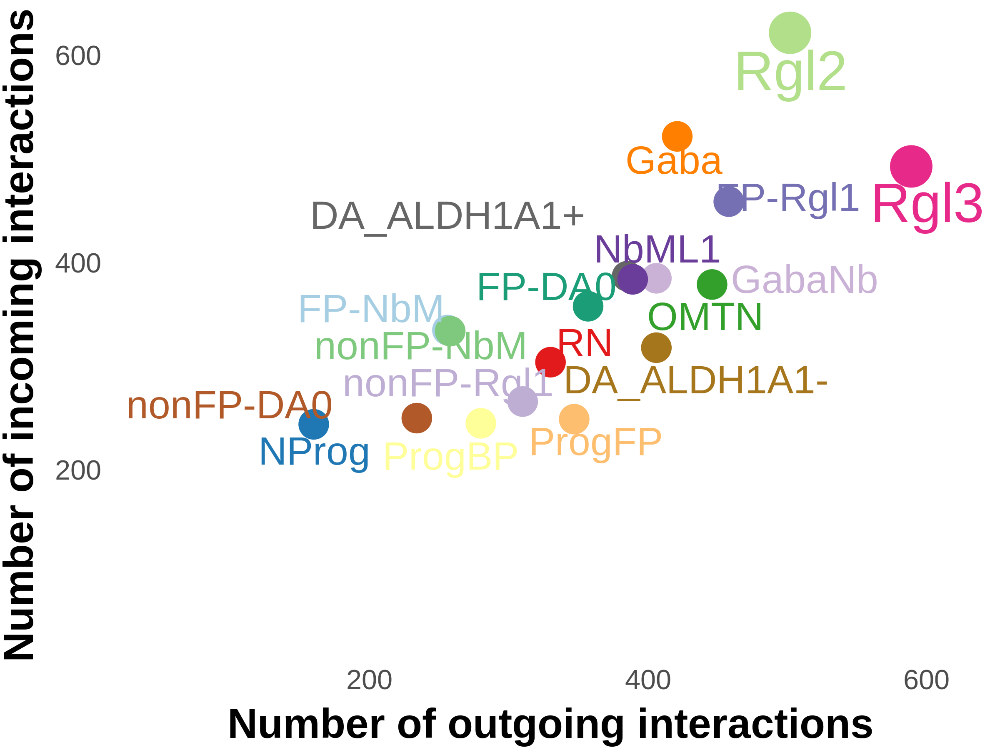

In [32]:
# overall signaling center in the dataset, as for sources and targets of signals. note, we are using all time points, all cell types, all ligand and receptors from the 3 DBs
# one could as well subset, eg to only look at neurodevelopmentally-related LR pairs and pathways

options(repr.plot.width=20, repr.plot.height=15)
df = communication_filtered

library(RColorBrewer)

# count occurrences for each cell type as signal source or signal target
source_counts <- df %>% group_by(source) %>% summarise(count_source = n())
target_counts <- df %>% group_by(target) %>% summarise(count_target = n())

# join the counts
counts_df <- full_join(source_counts, target_counts, by = c("source" = "target"))

# replace NA values with 0
counts_df[is.na(counts_df)] <- 0

# Merge counts_df with humouse to get corresponding colors
counts_df <- left_join(counts_df, humouse, by = c("source" = "human"))

library(ggrepel)

#pdf("h_scatter.pdf", width = 20, height = 15)
ggplot(counts_df, aes(x = count_source, y = count_target, label = source)) +
  geom_point(aes(color = color), size = ifelse(counts_df$source %in% c("Rgl3", "Rgl2", "Rgl1"), 28, 20)) + 
  geom_text_repel(aes(color = color, size = ifelse(source %in% c("Rgl3", "Rgl2", "Rgl1"), 28, 20)), 
                  vjust = 1.5, hjust = 0.5, nudge_x = 0.5, box.padding = 0.5, segment.size = 0) +
  labs(
    x = "Number of outgoing interactions", 
    y = "Number of incoming interactions"
  ) +
  scale_x_continuous(limits = c(10, 650), expand = c(0, 0)) + 
  scale_y_continuous(limits = c(10, 650), expand = c(0, 0)) +
  scale_color_identity(guide = "none") +  # This uses the actual color codes in the 'color' column
  scale_size_identity(guide = "none") +  # To ensure that the custom sizes you specified aren't modified
  theme_minimal() +
  theme(
    axis.title.x = element_text(size = 60, face = "bold", margin = margin(t = 20)),
    axis.title.y = element_text(size = 60, face = "bold", margin = margin(r = 20)),
    axis.text.x = element_text(size = 40),
    axis.text.y = element_text(size = 40),
    legend.position = "none",
    panel.grid.major = element_blank(),
    panel.grid.minor = element_blank(),
    panel.background = element_blank()
  )
#dev.off()

In [ ]:
# bootstrap analysis for "overall communication" significance - terziles of ligand expression

counts_df_ground_truth = counts_df

df_to_bootstrap = df %>% dplyr::select(source, target, ligand, receptor)

ligands = unique(df$ligand)

receptors = unique(df$receptor)

receptors = receptors[!receptors %in% c('CNTN2_CNTNAP2', 'ERBB2_ERBB4', 'ITGA6_ITGB1')]
receptors = c(receptors, "CNTN2", "ERBB2", "ITGA6")

library(Seurat)

Idents(so) = "celltype"
celltypes <- unique(Idents(so))

celltypes <- unique(Idents(so))

avg_expression <- data.frame(matrix(ncol = length(ligands), nrow = length(celltypes)))
rownames(avg_expression) <- celltypes
colnames(avg_expression) <- ligands

# calculate average expression for each ligand in each cell type
for (ligand in ligands) {
    for (celltype in celltypes) {
        cells <- WhichCells(so, ident = celltype)
        avg_expression[celltype, ligand] <- mean(FetchData(so, vars = ligand, cells = cells)[[1]])
    }
}

# initialize a list to store cell types in each trile for each ligand
trile_celltypes <- list()

for (ligand in ligands) {
    # calculate the trile thresholds
    thresholds <- quantile(avg_expression[[ligand]], probs = seq(0, 1, by = 1/3))
    
    trile_celltypes[[ligand]] <- vector("list", 3)
    names(trile_celltypes[[ligand]]) <- paste0("T", 1:3)

    for (celltype in celltypes) {
        for (t in 1:3) {
            if (avg_expression[celltype, ligand] <= thresholds[t + 1]) {
                trile_name <- paste0("T", t)
                trile_celltypes[[ligand]][[trile_name]] <- c(trile_celltypes[[ligand]][[trile_name]], celltype)
                break
            }
        }
    }
}

trile_celltypes_ligands <- trile_celltypes
trile_celltypes_ligands

In [ ]:
# same for receptors

library(Seurat)

celltypes <- unique(Idents(so))

avg_expression <- data.frame(matrix(ncol = length(receptors), nrow = length(celltypes)))
rownames(avg_expression) <- celltypes
colnames(avg_expression) <- receptors

for (receptor in receptors) {
    for (celltype in celltypes) {
        cells <- WhichCells(so, ident = celltype)
        avg_expression[celltype, receptor] <- mean(FetchData(so, vars = receptor, cells = cells)[[1]])
    }
}

trile_celltypes <- list()

for (receptor in receptors) {
    thresholds <- quantile(avg_expression[[receptor]], probs = seq(0, 1, by = 1/3))
    
    trile_celltypes[[receptor]] <- vector("list", 3)
    names(trile_celltypes[[receptor]]) <- paste0("T", 1:3)

    for (celltype in celltypes) {
        for (t in 1:3) {
            if (avg_expression[celltype, receptor] <= thresholds[t + 1]) {
                trile_name <- paste0("T", t)
                trile_celltypes[[receptor]][[trile_name]] <- c(trile_celltypes[[receptor]][[trile_name]], celltype)
                break
            }
        }
    }
}

trile_celltypes_receptors <- trile_celltypes
trile_celltypes_receptors

In [27]:
# bootstrap

df_to_bootstrap$source <- as.character(df_to_bootstrap$source)
df_to_bootstrap$target <- as.character(df_to_bootstrap$target)

cumulative_source_counts <- data.frame(matrix(nrow=19, ncol=0))
cumulative_target_counts <- data.frame(matrix(nrow=19, ncol=0))

for (i in 1:10000) {
    print(i)
    df_modified <- df_to_bootstrap

    df_modified$receptor[df_modified$receptor == 'CNTN2_CNTNAP2'] = "CNTN2"
    df_modified$receptor[df_modified$receptor == 'ERBB2_ERBB4'] = "ERBB2"
    df_modified$receptor[df_modified$receptor == 'ITGA6_ITGB1'] = "ITGA6"

    for (y in 1:nrow(df_modified)){
        L = df_modified$ligand[y]
        q = trile_celltypes_ligands[[L]]
        needle = df_modified$source[y]
        trile = names(q)[unlist(lapply(q[1:3], function(x) needle %in% x))]                               
        SOURCE_NEW = sample(q[[trile]], 1)    

        R = df_modified$receptor[y]
        q = trile_celltypes_receptors[[R]]
        needle = df_modified$target[y]
        trile = names(q)[unlist(lapply(q[1:3], function(x) needle %in% x))]                               
        TARGET_NEW = sample(q[[trile]], 1)   

        df_modified$source[y] = SOURCE_NEW          
        df_modified$target[y] = TARGET_NEW      
    }

    source_counts <- df_modified %>% group_by(source) %>% summarise(count_source = n())
    target_counts <- df_modified %>% group_by(target) %>% summarise(count_target = n())

    cumulative_source_counts <- data.frame(cbind(cumulative_source_counts, source_counts$count_source))
    cumulative_target_counts <- data.frame(cbind(cumulative_target_counts, target_counts$count_target))
}

                                       
rownames(cumulative_source_counts) = source_counts$source
rownames(cumulative_target_counts) = target_counts$target
                                       
library(gridExtra)
                                       
percentile_99_9 <- quantile(data_flat, 0.95)

library(ggplot2)

x_values <- seq(from = 0, to = percentile_99_9, length.out = 100)
y_values <- percentile_99_9 - x_values
line_data <- data.frame(x = x_values, y = y_values)   
                                       
#pdf("h_scatter_wdash.pdf", width = 20, height = 15)

ggplot(counts_df, aes(x = count_source, y = count_target)) +
  geom_abline(slope = 1, intercept = 0, linetype = "dashed", color = "lightgray", linewidth = 4) +  # Diagonal line
  geom_point(aes(color = color), size = ifelse(counts_df$source %in% c("Rgl3", "Rgl2", "Rgl1"), 28, 20)) + 
  geom_text_repel(aes(label = source, color = color, size = ifelse(source %in% c("Rgl3", "Rgl2", "Rgl1"), 28, 20)), 
                  vjust = 1.5, hjust = 0.5, nudge_x = 0.5, box.padding = 0.5, segment.size = 0) +
  labs(
    x = "Number of outgoing interactions", 
    y = "Number of incoming interactions"
  ) +
  scale_x_continuous(limits = c(10, 650), expand = c(0, 0)) + 
  scale_y_continuous(limits = c(10, 650), expand = c(0, 0)) +
  scale_color_identity(guide = "none") +  
  scale_size_identity(guide = "none") +  
  theme_minimal() +
  theme(
    axis.title.x = element_text(size = 60, face = "bold", margin = margin(t = 20)),
    axis.title.y = element_text(size = 60, face = "bold", margin = margin(r = 20)),
    axis.text.x = element_text(size = 40),
    axis.text.y = element_text(size = 40),
    legend.position = "none",
    panel.grid.major = element_blank(),
    panel.grid.minor = element_blank(),
    panel.background = element_blank()
  ) +
  geom_line(data = line_data, aes(x = x, y = y), linetype = "dashed", linewidth = 4)  # Adding the percentile line

#dev.off()                                       

[1] 1
[1] 2
[1] 3
[1] 4
[1] 5
[1] 6
[1] 7
[1] 8
[1] 9
[1] 10
[1] 11
[1] 12
[1] 13
[1] 14
[1] 15
[1] 16
[1] 17
[1] 18
[1] 19
[1] 20
[1] 21
[1] 22
[1] 23
[1] 24
[1] 25
[1] 26
[1] 27
[1] 28
[1] 29
[1] 30
[1] 31
[1] 32
[1] 33
[1] 34
[1] 35
[1] 36
[1] 37
[1] 38
[1] 39
[1] 40
[1] 41
[1] 42
[1] 43
[1] 44
[1] 45
[1] 46
[1] 47
[1] 48
[1] 49
[1] 50
[1] 51
[1] 52
[1] 53
[1] 54
[1] 55
[1] 56
[1] 57
[1] 58
[1] 59
[1] 60
[1] 61
[1] 62
[1] 63
[1] 64
[1] 65
[1] 66
[1] 67
[1] 68
[1] 69
[1] 70
[1] 71
[1] 72
[1] 73
[1] 74
[1] 75
[1] 76
[1] 77
[1] 78
[1] 79
[1] 80
[1] 81
[1] 82
[1] 83
[1] 84
[1] 85
[1] 86
[1] 87
[1] 88
[1] 89
[1] 90
[1] 91
[1] 92
[1] 93
[1] 94
[1] 95
[1] 96
[1] 97
[1] 98
[1] 99
[1] 100
[1] 101
[1] 102
[1] 103
[1] 104
[1] 105
[1] 106
[1] 107
[1] 108
[1] 109
[1] 110
[1] 111
[1] 112
[1] 113
[1] 114
[1] 115
[1] 116
[1] 117
[1] 118
[1] 119
[1] 120
[1] 121
[1] 122
[1] 123
[1] 124
[1] 125
[1] 126
[1] 127
[1] 128
[1] 129
[1] 130
[1] 131
[1] 132
[1] 133
[1] 134
[1] 135
[1] 136
[1] 137
[1] 138
[1] 

In [33]:
# RGL3 AS A SOURCE OF SIGNALS
df.net2 = communication_filtered[order(communication_filtered$prob, decreasing=TRUE), ]
df.net3 = df.net2[df.net2$source %in% c("Rgl3") & (df.net2$receptor != "NTNG1") & (df.net2$ligand != "HMGB1"),]
df.net3 = df.net3[df.net3$ligand != df.net3$receptor,]
unique(df.net3$interaction_name)

[1] SLIT2_ROBO1      NTN1_DCC         SLIT2_DCC        SLIT2_ROBO2     
  [5] NRG3_ERBB4       NRG3_ERBB41      NCAM1_ROBO1      NTN1_UNC5D      
  [9] SLIT1_ROBO1      NLGN1_NRXN3      APP_DCC          CCN2_ERBB4      
 [13] APP_RPSA         NLGN1_NRXN1      PTN_PTPRZ1       PTN_PTPRZ       
 [17] PTN_PTPRZ11      CALM1_PTPRA      MIF_CXCR4        PTN_NCL         
 [21] SHH_GPC5         NCAM1_NCAM2      CNTN4_PTPRG      APP_APLP1       
 [25] SLIT2_GPC1       NTN1_NEO1        APP_APLP2        NCAM1_PTPRA     
 [29] CALM1_CACNA1C    MDK_PTPRZ1       MDK_PTPRZ11      MK_PTPRZ        
 [33] PTN_PTPRS        PPIA_BSG         HSP90AA1_FGFR3   MDK_NCL         
 [37] CALM1_KCNQ3      BCAN_NRCAM       TENM4_ADGRL3     CALM1_KCNQ1     
 [41] NCAM1_CACNA1C    PTPRS_LRRTM4     MDK_GPC2         APLP2_PLXNA4    
 [45] EFNB3_EPHB1      EFNB3_EPHB11     RGMA_BMPR2       APP_GPC1        
 [49] GNAI2_EDNRB      EFNB3_EPHB2      EFNB3_EPHB21     HSP90AA1_LRP1   
 [53] RGMA_NEO1        CADM3_CADM1      TENM3_ADGRL3     PTPRD_LRFN5     
 [57] NXPH1_NRXN3      MIF_ACKR3        RGMA_BMPR1B      NRG3_ERBB2_ERBB4
 [61] SLIT1_GPC1       PTN_SDC2         CALM1_GRM7       SPTAN1_PTPRA    
 [65] APP_LRP6         NXPH1_NRXN1      DCN_ERBB4        PTPRS_LRFN5     
 [69] HSP90B1_LRP1     CALM1_INSR       AFDN_NRXN3       CCN2_LRP6       
 [73] APP_NOTCH2       NCAM1_GFRA1      PSAP_LRP1        CALM1_PDE1A     
 [77] NCAM1_L1CAM      WNT5A_FZD3       SLIT1_FLRT3      CALR_LRP1       
 [81] NTN1_UNC5C       SHH_GPC1         WNT5A_FZD31      ADAM17_ERBB4    
 [85] MDK_ITGA6        SLIT3_ROBO1      NRXN1_LRRTM4     CADM1_NECTIN3   
 [89] APP_LRP1         SHH_PTCH11       CALM1_GRM5       CALM3_CACNA1C   
 [93] SEMA6A_PLXNA4    SEMA6A_PLXNA41   APP_GRM7         CALM1_PDE1C     
 [97] CALM1_RYR2       CALM1_GRM3       MDK_SDC2         CCN2_LRP1       
[101] VIM_CD44         GNAI2_IGF1R     
4811 Levels: TGFB1_TGFBR1_TGFBR2 TGFB2_TGFBR1_TGFBR2 ... ZP3_EGFR

In [34]:
# customizing the CellChat plotting function to make it able to color by target instead of source
# function from https://github.com/sqjin/CellChat/blob/master/R/visualization.R

library(circlize)

netVisual_chord_gene_CUSTOM <- function(object, slot.name = "net", color.use = NULL,
                                 signaling = NULL, pairLR.use = NULL, net = NULL,
                                 sources.use = NULL, targets.use = NULL,
                                 lab.cex = 0.8,small.gap = 1, big.gap = 10, annotationTrackHeight = c(0.03),
                                 link.visible = TRUE, scale = FALSE, directional = 1, link.target.prop = TRUE, reduce = -1,
                                 transparency = 0.4, link.border = NA,
                                 title.name = NULL, legend.pos.x = 20, legend.pos.y = 20, show.legend = TRUE,
                                 thresh = 0.05,
                                 ...){
  if (!is.null(pairLR.use)) {
    if (!is.data.frame(pairLR.use)) {
      stop("pairLR.use should be a data frame with a signle column named either 'interaction_name' or 'pathway_name' ")
    } else if ("pathway_name" %in% colnames(pairLR.use)) {
      message("slot.name is set to be 'netP' when pairLR.use contains signaling pathways")
      slot.name = "netP"
    }
  }

  if (!is.null(pairLR.use) & !is.null(signaling)) {
    stop("Please do not assign values to 'signaling' when using 'pairLR.use'")
  }

  if (is.null(net)) {
    prob <- slot(object, "net")$prob
    pval <- slot(object, "net")$pval
    prob[pval > thresh] <- 0
    net <- reshape2::melt(prob, value.name = "prob")
    colnames(net)[1:3] <- c("source","target","interaction_name")

    pairLR = dplyr::select(object@LR$LRsig, c("interaction_name_2", "pathway_name",  "ligand",  "receptor" ,"annotation","evidence"))
    idx <- match(net$interaction_name, rownames(pairLR))
    temp <- pairLR[idx,]
    net <- cbind(net, temp)
  }

  if (!is.null(signaling)) {
    pairLR.use <- data.frame()
    for (i in 1:length(signaling)) {
      pairLR.use.i <- searchPair(signaling = signaling[i], pairLR.use = object@LR$LRsig, key = "pathway_name", matching.exact = T, pair.only = T)
      pairLR.use <- rbind(pairLR.use, pairLR.use.i)
    }
  }

  if (!is.null(pairLR.use)){
    if ("interaction_name" %in% colnames(pairLR.use)) {
      net <- subset(net,interaction_name %in% pairLR.use$interaction_name)
    } else if ("pathway_name" %in% colnames(pairLR.use)) {
      net <- subset(net, pathway_name %in% as.character(pairLR.use$pathway_name))
    }
  }

  if (slot.name == "netP") {
    net <- dplyr::select(net, c("source","target","pathway_name","prob"))
    net$source_target <- paste(net$source, net$target, sep = "sourceTotarget")
    net <- net %>% dplyr::group_by(source_target, pathway_name) %>% dplyr::summarize(prob = sum(prob))
    a <- stringr::str_split(net$source_target, "sourceTotarget", simplify = T)
    net$source <- as.character(a[, 1])
    net$target <- as.character(a[, 2])
    net$ligand <- net$pathway_name
    net$receptor <- " "
  }

  # keep the interactions associated with sources and targets of interest
  if (!is.null(sources.use)){
    if (is.numeric(sources.use)) {
      sources.use <- levels(object@idents)[sources.use]
    }
    net <- subset(net, source %in% sources.use)
  } else {
    sources.use <- levels(object@idents)
  }
  if (!is.null(targets.use)){
    if (is.numeric(targets.use)) {
      targets.use <- levels(object@idents)[targets.use]
    }
    net <- subset(net, target %in% targets.use)
  } else {
    targets.use <- levels(object@idents)
  }
  # remove the interactions with zero values
  df <- subset(net, prob > 0)

  if (nrow(df) == 0) {
    stop("No signaling links are inferred! ")
  }

  if (length(unique(net$ligand)) == 1) {
    message("You may try the function `netVisual_chord_cell` for visualizing individual signaling pathway")
  }

  df$id <- 1:nrow(df)
  # deal with duplicated sector names
  ligand.uni <- unique(df$ligand)
  for (i in 1:length(ligand.uni)) {
    df.i <- df[df$ligand == ligand.uni[i], ]
    source.uni <- unique(df.i$source)
    for (j in 1:length(source.uni)) {
      df.i.j <- df.i[df.i$source == source.uni[j], ]
      df.i.j$ligand <- paste0(df.i.j$ligand, paste(rep(' ',j-1),collapse = ''))
      df$ligand[df$id %in% df.i.j$id] <- df.i.j$ligand
    }
  }
  receptor.uni <- unique(df$receptor)
  for (i in 1:length(receptor.uni)) {
    df.i <- df[df$receptor == receptor.uni[i], ]
    target.uni <- unique(df.i$target)
    for (j in 1:length(target.uni)) {
      df.i.j <- df.i[df.i$target == target.uni[j], ]
      df.i.j$receptor <- paste0(df.i.j$receptor, paste(rep(' ',j-1),collapse = ''))
      df$receptor[df$id %in% df.i.j$id] <- df.i.j$receptor
    }
  }

  cell.order.sources <- levels(object@idents)[levels(object@idents) %in% sources.use]
  cell.order.targets <- levels(object@idents)[levels(object@idents) %in% targets.use]

  df$source <- factor(df$source, levels = cell.order.sources)
  df$target <- factor(df$target, levels = cell.order.targets)
  # df.ordered.source <- df[with(df, order(source, target, -prob)), ]
  # df.ordered.target <- df[with(df, order(target, source, -prob)), ]
  df.ordered.source <- df[with(df, order(source, -prob)), ]
  df.ordered.target <- df[with(df, order(target, -prob)), ]

  order.source <- unique(df.ordered.source[ ,c('ligand','source')])
  order.target <- unique(df.ordered.target[ ,c('receptor','target')])

  # define sector order
  order.sector <- c(order.source$ligand, order.target$receptor)

  # define cell type color
  if (is.null(color.use)){
    color.use = scPalette(nlevels(object@idents))
    names(color.use) <- levels(object@idents)
    color.use <- color.use[levels(object@idents) %in% as.character(union(df$source,df$target))]
  } else if (is.null(names(color.use))) {
    names(color.use) <- levels(object@idents)
    color.use <- color.use[levels(object@idents) %in% as.character(union(df$source,df$target))]
  }

  # define edge color
  edge.color <- color.use[as.character(df.ordered.source$target)]
  names(edge.color) <- as.character(df.ordered.source$target)
  print(edge.color)
  # define grid colors
  grid.col.ligand <- color.use[as.character(order.source$source)]
  names(grid.col.ligand) <- as.character(order.source$source)
  grid.col.receptor <- color.use[as.character(order.target$target)]
  names(grid.col.receptor) <- as.character(order.target$target)
  grid.col <- c(as.character(grid.col.ligand), as.character(grid.col.receptor))
  names(grid.col) <- order.sector
  #print(grid.col)

  df.plot <- df.ordered.source[ ,c('ligand','receptor','prob')]
  #print(df.plot)
    
  if (directional == 2) {
    link.arr.type = "triangle"
  } else {
    link.arr.type = "big.arrow"
  }
  circos.clear()
  chordDiagram(df.plot,
               order = order.sector,
               col = edge.color,
               grid.col = grid.col,
               transparency = transparency,
               link.border = link.border,
               directional = directional,
               direction.type = c("diffHeight","arrows"),
               link.arr.type = link.arr.type,
               annotationTrack = "grid",
               annotationTrackHeight = annotationTrackHeight,
               preAllocateTracks = list(track.height = max(strwidth(order.sector))),
               small.gap = small.gap,
               big.gap = big.gap,
               link.visible = link.visible,
               scale = scale,
               link.target.prop = link.target.prop,
               reduce = reduce,
               ...)

  circos.track(track.index = 1, panel.fun = function(x, y) {
    xlim = get.cell.meta.data("xlim")
    xplot = get.cell.meta.data("xplot")
    ylim = get.cell.meta.data("ylim")
    sector.name = get.cell.meta.data("sector.index")
    circos.text(mean(xlim), ylim[1], sector.name, facing = "clockwise", niceFacing = TRUE, adj = c(0, 0.5),cex = lab.cex)
  }, bg.border = NA)

  # https://jokergoo.github.io/circlize_book/book/legends.html
  if (show.legend) {
    lgd <- ComplexHeatmap::Legend(at = names(color.use), type = "grid", legend_gp = grid::gpar(fill = color.use), title = "Cell State")
    ComplexHeatmap::draw(lgd, x = unit(1, "npc")-unit(legend.pos.x, "mm"), y = unit(legend.pos.y, "mm"), just = c("right", "bottom"))
  }

  circos.clear()
  if(!is.null(title.name)){
    text(-0, 1.02, title.name, cex=1)
  }
  gg <- recordPlot()
  return(gg)
}


circlize version 0.4.15
CRAN page: https://cran.r-project.org/package=circlize
Github page: https://github.com/jokergoo/circlize
Documentation: https://jokergoo.github.io/circlize_book/book/

If you use it in published research, please cite:
Gu, Z. circlize implements and enhances circular visualization
  in R. Bioinformatics 2014.

This message can be suppressed by:
  suppressPackageStartupMessages(library(circlize))



Attaching package: 'circlize'


The following object is masked from 'package:igraph':

    degree




 [1] "NTN1"  "SLIT2" "NRG3"  "CCN2"  "MIF"   "NLGN1" "PTN"   "NCAM1" "SLIT1"
[10] "TENM4" "CADM3" "RGMA"  "MDK"   "DCN"   "TENM3" "BCAN"  "NXPH1"
 [1] "DCC"    "ERBB4"  "UNC5D"  "ROBO1"  "CXCR4"  "NRXN1"  "PTPRS"  "ROBO2" 
 [9] "ADGRL3" "CADM1"  "BMPR2"  "GPC2"   "NRCAM" 
   FP-NbM    FP-NbM    FP-DA0    FP-DA0    FP-DA0    FP-DA0    FP-NbM    FP-NbM 
"#A6CEE3" "#A6CEE3" "#1B9E77" "#1B9E77" "#1B9E77" "#1B9E77" "#A6CEE3" "#A6CEE3" 
   FP-NbM    FP-DA0    FP-NbM    FP-DA0    FP-NbM    FP-NbM    FP-DA0    FP-DA0 
"#A6CEE3" "#1B9E77" "#A6CEE3" "#1B9E77" "#A6CEE3" "#A6CEE3" "#1B9E77" "#1B9E77" 
   FP-NbM    FP-DA0    FP-NbM    FP-NbM    FP-DA0    FP-DA0    FP-NbM    FP-DA0 
"#A6CEE3" "#1B9E77" "#A6CEE3" "#A6CEE3" "#1B9E77" "#1B9E77" "#A6CEE3" "#1B9E77" 
   FP-NbM    FP-DA0    FP-NbM    FP-NbM    FP-DA0    FP-DA0    FP-NbM    FP-DA0 
"#A6CEE3" "#1B9E77" "#A6CEE3" "#A6CEE3" "#1B9E77" "#1B9E77" "#A6CEE3" "#1B9E77" 
   FP-NbM    FP-NbM    FP-DA0    FP-DA0    FP-NbM    FP-DA0    FP-NbM 
"#A6CEE3

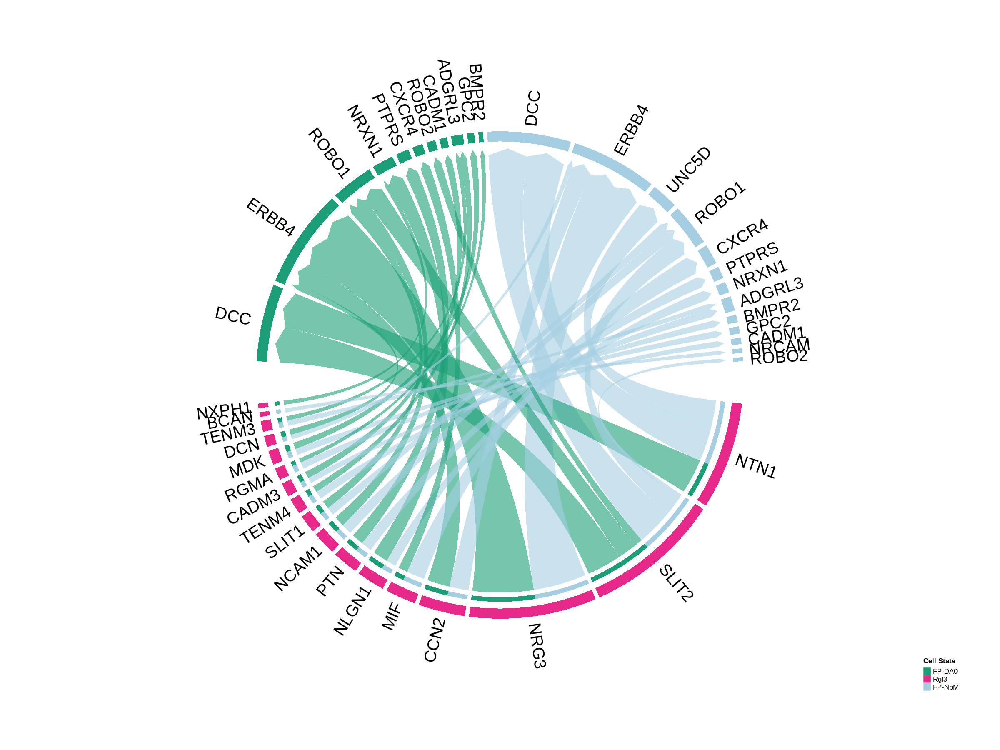

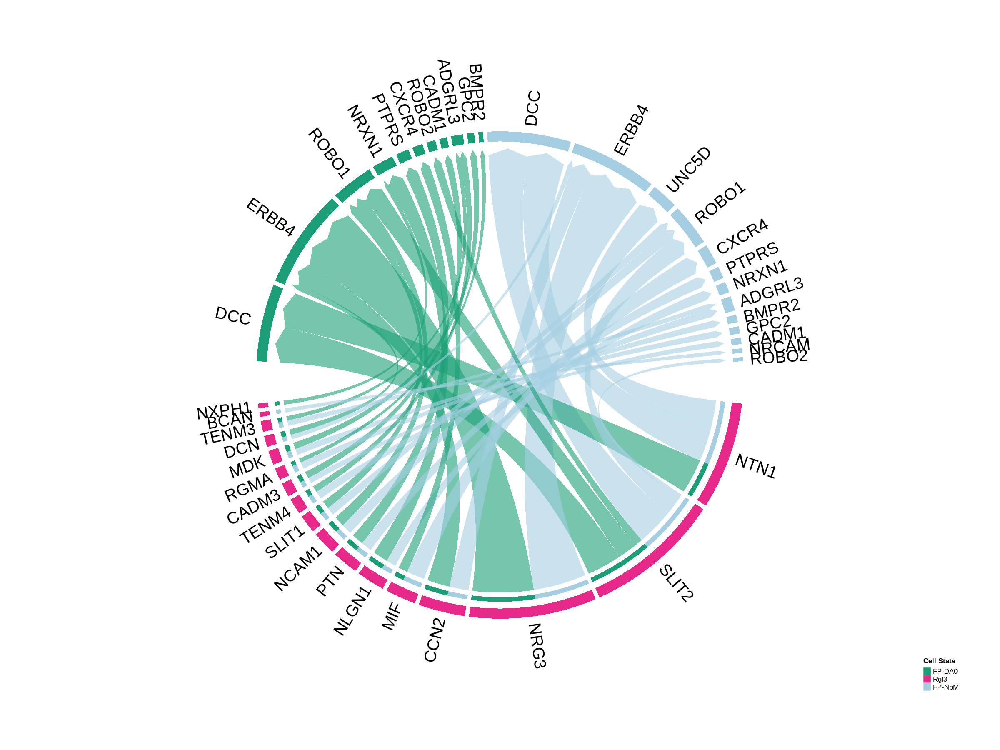

In [35]:
# looking at signaling from Rgl3 to most interesting targets in the dopaminergic niche - subsetting needed for readability
false_lr = c("APP", "HSP90AA1", "CALM1", "RPSA", "NCL", "ADAM17")

df.net3 = df.net3[(!df.net3$ligand %in% false_lr) & (!df.net3$receptor %in% false_lr), ]
write.table(df.net3, file="allcomms_from_rgl3_human_filtered_subsetted.txt", quote=FALSE, row.names=FALSE)

CINT = c("FP-NbM", "FP-DA0")

df.net4 = df.net3[df.net3$target %in% CINT, ]

colors_of_interest <- humouse$color[humouse$human %in% c("Rgl3", CINT)]
colors.use <- setNames(colors_of_interest, humouse$human[humouse$human %in% c("Rgl3", CINT)])

unique_ligands <- unique(df.net4$ligand)
num_ligands <- length(unique_ligands)

set.seed(123)
ligand_colors <- as.data.frame(sample(colors(), num_ligands))

rownames(ligand_colors) <- unique_ligands

colnames(ligand_colors) = "value"
ligand_colors$ligand <- unique_ligands

df.net4 = dplyr::left_join(df.net4, ligand_colors, by=c("ligand"="ligand"))

print(unique(df.net4$ligand))
print(unique(df.net4$receptor))

netVisual_chord_gene_CUSTOM(cellchat, net=df.net4, lab.cex = 2, legend.pos.y = 30,  color.use=colors.use)

 [1] "NTN1"  "SLIT2" "NRG3"  "NLGN1" "CCN2"  "NCAM1" "SLIT1" "PTN"   "NXPH1"
[10] "CADM3" "MDK"   "DCN"   "TENM4" "AFDN"  "CNTN4" "TENM3" "BCAN" 
 [1] "DCC"    "ERBB4"  "ROBO2"  "NRXN3"  "ROBO1"  "NRXN1"  "PTPRS"  "CADM1" 
 [9] "GPC2"   "ADGRL3" "PTPRG"  "NRCAM" 
DA_ALDH1A1+ DA_ALDH1A1+ DA_ALDH1A1- DA_ALDH1A1- DA_ALDH1A1+ DA_ALDH1A1+ 
  "#666666"   "#666666"   "#A6761D"   "#A6761D"   "#666666"   "#666666" 
DA_ALDH1A1+ DA_ALDH1A1- DA_ALDH1A1- DA_ALDH1A1+ DA_ALDH1A1+ DA_ALDH1A1+ 
  "#666666"   "#A6761D"   "#A6761D"   "#666666"   "#666666"   "#666666" 
DA_ALDH1A1- DA_ALDH1A1- DA_ALDH1A1- DA_ALDH1A1- DA_ALDH1A1- DA_ALDH1A1+ 
  "#A6761D"   "#A6761D"   "#A6761D"   "#A6761D"   "#A6761D"   "#666666" 
DA_ALDH1A1+ DA_ALDH1A1- DA_ALDH1A1+ DA_ALDH1A1+ DA_ALDH1A1- DA_ALDH1A1- 
  "#666666"   "#A6761D"   "#666666"   "#666666"   "#A6761D"   "#A6761D" 
DA_ALDH1A1+ DA_ALDH1A1+ DA_ALDH1A1- DA_ALDH1A1- DA_ALDH1A1- DA_ALDH1A1+ 
  "#666666"   "#666666"   "#A6761D"   "#A6761D"   "#A6761D"   "#666666" 
DA_ALD

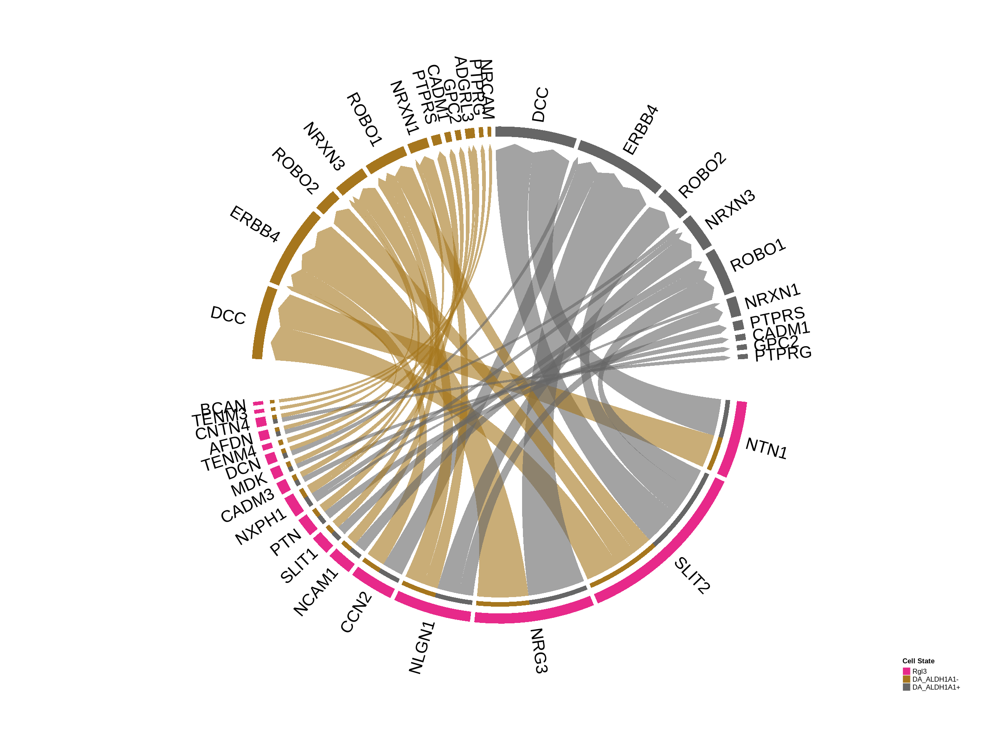

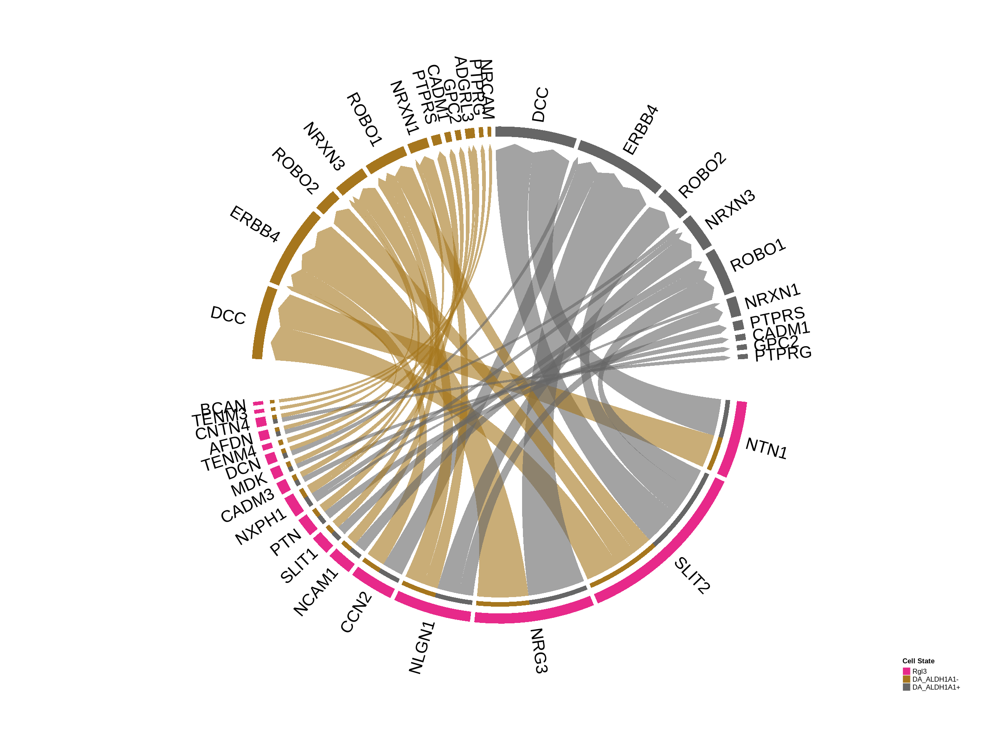

In [36]:
CINT = c("DA_ALDH1A1+", "DA_ALDH1A1-")

df.net4 = df.net3[df.net3$target %in% CINT, ]
df.net4 = df.net4[df.net4$ligand != "PTPRS",] # this is a receptor
df.net4 = df.net4[df.net4$ligand != "NRXN1",] # this is a receptor

colors_of_interest <- humouse$color[humouse$human %in% c("Rgl3", CINT)]
colors.use <- setNames(colors_of_interest, humouse$human[humouse$human %in% c("Rgl3", CINT)])

unique_ligands <- unique(df.net4$ligand)
num_ligands <- length(unique_ligands)

set.seed(123)
ligand_colors <- as.data.frame(sample(colors(), num_ligands))

rownames(ligand_colors) <- unique_ligands

colnames(ligand_colors) = "value"
ligand_colors$ligand <- unique_ligands

df.net4 = dplyr::left_join(df.net4, ligand_colors, by=c("ligand"="ligand"))

print(unique(df.net4$ligand))
print(unique(df.net4$receptor))

netVisual_chord_gene_CUSTOM(cellchat, net=df.net4, lab.cex = 2, legend.pos.y = 30,  color.use=colors.use)

 [1] "NTN1"  "SLIT2" "NRG3"  "CCN2"  "PTN"   "CNTN4" "MDK"   "TENM4" "EFNB3"
[10] "NCAM1" "BCAN"  "RGMA"  "TENM3" "WNT5A" "SLIT1" "DCN"   "GNAI2"
 [1] "DCC"         "ERBB4"       "PTPRZ1"      "PTPRS"       "NEO1"       
 [6] "PTPRG"       "ADGRL3"      "EPHB2"       "PTPRA"       "NRCAM"      
[11] "BMPR2"       "NCAM2"       "ERBB2_ERBB4" "GPC1"        "FZD3"       
[16] "FLRT3"       "EDNRB"      
  FP-Rgl1   FP-Rgl1   FP-Rgl1   FP-Rgl1   FP-Rgl1   FP-Rgl1   FP-Rgl1   FP-Rgl1 
"#7570B3" "#7570B3" "#7570B3" "#7570B3" "#7570B3" "#7570B3" "#7570B3" "#7570B3" 
  FP-Rgl1   FP-Rgl1   FP-Rgl1   FP-Rgl1   FP-Rgl1   FP-Rgl1   FP-Rgl1   FP-Rgl1 
"#7570B3" "#7570B3" "#7570B3" "#7570B3" "#7570B3" "#7570B3" "#7570B3" "#7570B3" 
  FP-Rgl1   FP-Rgl1   FP-Rgl1   FP-Rgl1   FP-Rgl1   FP-Rgl1   FP-Rgl1   FP-Rgl1 
"#7570B3" "#7570B3" "#7570B3" "#7570B3" "#7570B3" "#7570B3" "#7570B3" "#7570B3" 
  FP-Rgl1   FP-Rgl1   FP-Rgl1   FP-Rgl1   FP-Rgl1   FP-Rgl1 
"#7570B3" "#7570B3" "#7570B3" "#7570B3" "#7570B3"

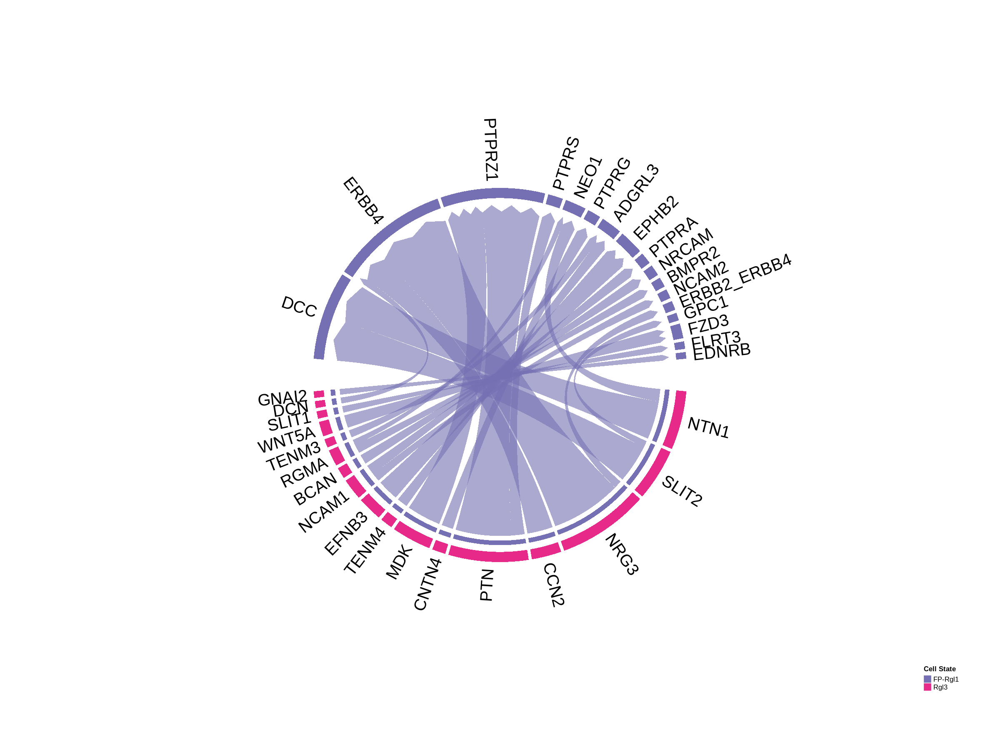

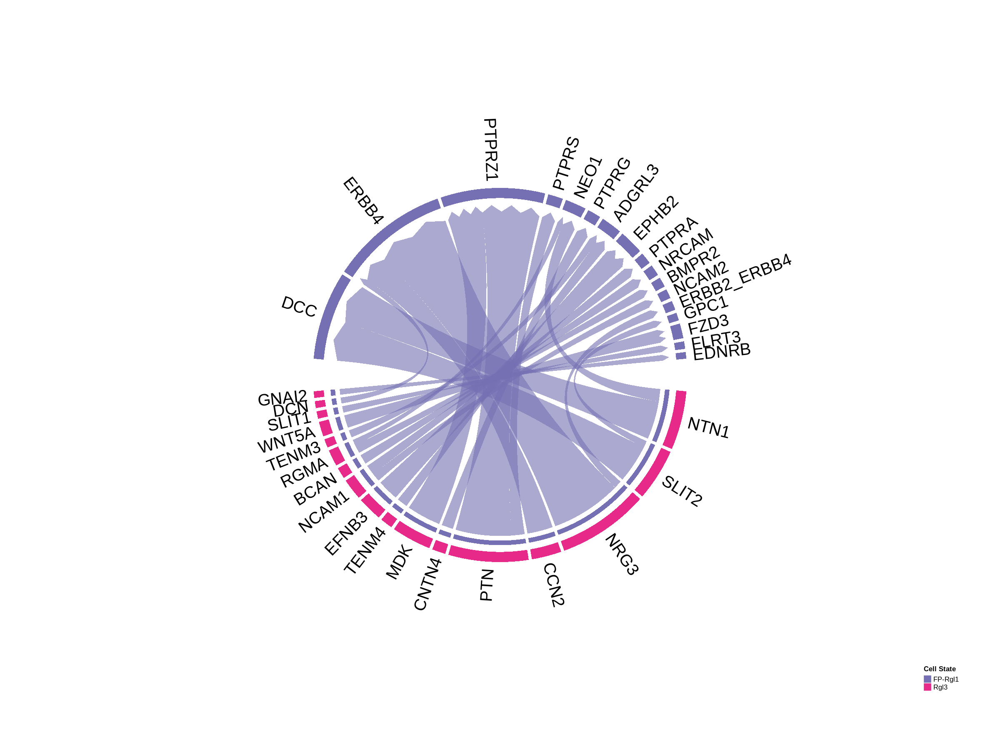

In [37]:
CINT = c("FP-Rgl1")

df.net4 = df.net3[df.net3$target %in% CINT, ]

colors_of_interest <- humouse$color[humouse$human %in% c("Rgl3", CINT)]
colors.use <- setNames(colors_of_interest, humouse$human[humouse$human %in% c("Rgl3", CINT)])

unique_ligands <- unique(df.net4$ligand)
num_ligands <- length(unique_ligands)

set.seed(123)
ligand_colors <- as.data.frame(sample(colors(), num_ligands))

rownames(ligand_colors) <- unique_ligands

colnames(ligand_colors) = "value"
ligand_colors$ligand <- unique_ligands

df.net4 = dplyr::left_join(df.net4, ligand_colors, by=c("ligand"="ligand"))

print(unique(df.net4$ligand))
print(unique(df.net4$receptor))

netVisual_chord_gene_CUSTOM(cellchat, net=df.net4, lab.cex = 2, legend.pos.y = 30,  color.use=colors.use)

[1] SLIT2_ROBO1     SLIT2_DCC       SLIT2_ROBO2     NTN1_DCC       
 [5] HMGB1_CXCR4     CCN2_ERBB4      NCAM1_ROBO1     NTN1_UNC5D     
 [9] SLIT1_ROBO1     NLGN1_NRXN3     MDK_PTPRZ1      MDK_PTPRZ11    
[13] MK_PTPRZ        AFDN_NRXN3      SLIT2_GPC1      NXPH1_NRXN3    
[17] MDK_NCL         APP_DCC         TENM4_ADGRL3    NLGN1_NRXN1    
[21] CALM1_PTPRA     APP_RPSA        PPIA_BSG        MIF_CXCR4      
[25] TENM3_ADGRL3    NXPH1_NRXN1     MDK_GPC2        NTN1_NEO1      
[29] HSP90AA1_FGFR3  SHH_GPC5        CALM1_CACNA1C   APP_APLP1      
[33] PTPRS_LRRTM4    NCAM1_NCAM2     PTPRD_LRFN5     CALM1_KCNQ3    
[37] APP_APLP2       PTN_PTPRZ1      PTN_PTPRZ       PTN_PTPRZ11    
[41] COL4A5_CD47     RSPO2_ZNRF3     NCAM1_PTPRA     FLRT3_ADGRL3   
[45] PTN_NCL         HSP90AA1_LRP1   CALM1_KCNQ1     MDK_ITGA6      
[49] PTPRS_LRFN5     CADM1_NECTIN3   AFDN_NECTIN3    AFDN_EPHB2     
[53] MDK_SDC2        GNAI2_EDNRB     RGMA_BMPR2      WNT5A_FZD3     
[57] APP_GPC1        NCAM1_CACNA1C   MDK_ITGB1       MIF_ACKR3      
[61] WNT5A_FZD31     PTN_PTPRS       CALM1_GRM7      RGMA_NEO1      
[65] SLIT1_GPC1      SPTAN1_PTPRA    CCN2_LRP6       BCAN_NRCAM     
[69] RGMA_BMPR1B     ADAM17_ERBB4    SMS_SSR2        CALM3_CACNA1C  
[73] APLP2_PLXNA4    CALM1_INSR      MDK_LRP1        MDK_LRP11      
[77] BMP7_BMPR2      CALM1_PDE1A     PSAP_LRP1       APP_LRP6       
[81] HSP90B1_LRP1    WNT5A_FRZB      MDK_ITGA6_ITGB1 PTPRD_LRRC4B   
[85] CALM3_KCNQ3     NTN1_UNC5C      SLIT1_FLRT3     WNT5A_ANTXR1   
4811 Levels: TGFB1_TGFBR1_TGFBR2 TGFB2_TGFBR1_TGFBR2 ... ZP3_EGFR

 [1] "SLIT2"  "NTN1"   "HMGB1"  "CCN2"   "TENM4"  "MIF"    "MDK"    "TENM3" 
 [9] "COL4A5" "NLGN1"  "FLRT3"  "NCAM1"  "NXPH1"  "CADM1"  "SLIT1"  "PTN"   
[17] "AFDN"   "WNT5A"  "RGMA"   "GNAI2"  "SPTAN1" "PTPRD"  "BMP7"  
 [1] "DCC"     "CXCR4"   "ROBO1"   "UNC5D"   "ERBB4"   "ADGRL3"  "PTPRZ1" 
 [8] "GPC2"    "CD47"    "NEO1"    "NRXN1"   "PTPRA"   "NECTIN3" "SDC2"   
[15] "GPC1"    "ITGB1"   "FZD3"    "BMPR2"   "PTPRS"   "EDNRB"   "ROBO2"  
[22] "LRRC4B" 
   FP-NbM      Rgl3    FP-NbM    FP-NbM      Rgl3    FP-NbM    FP-NbM    FP-NbM 
"#A6CEE3" "#E7298A" "#A6CEE3" "#A6CEE3" "#E7298A" "#A6CEE3" "#A6CEE3" "#A6CEE3" 
     Rgl3    FP-NbM      Rgl3      Rgl3      Rgl3      Rgl3    FP-NbM      Rgl3 
"#E7298A" "#A6CEE3" "#E7298A" "#E7298A" "#E7298A" "#E7298A" "#A6CEE3" "#E7298A" 
   FP-NbM    FP-NbM      Rgl3      Rgl3    FP-NbM      Rgl3      Rgl3    FP-NbM 
"#A6CEE3" "#A6CEE3" "#E7298A" "#E7298A" "#A6CEE3" "#E7298A" "#E7298A" "#A6CEE3" 
     Rgl3    FP-NbM    FP-NbM      Rgl3      Rgl3   

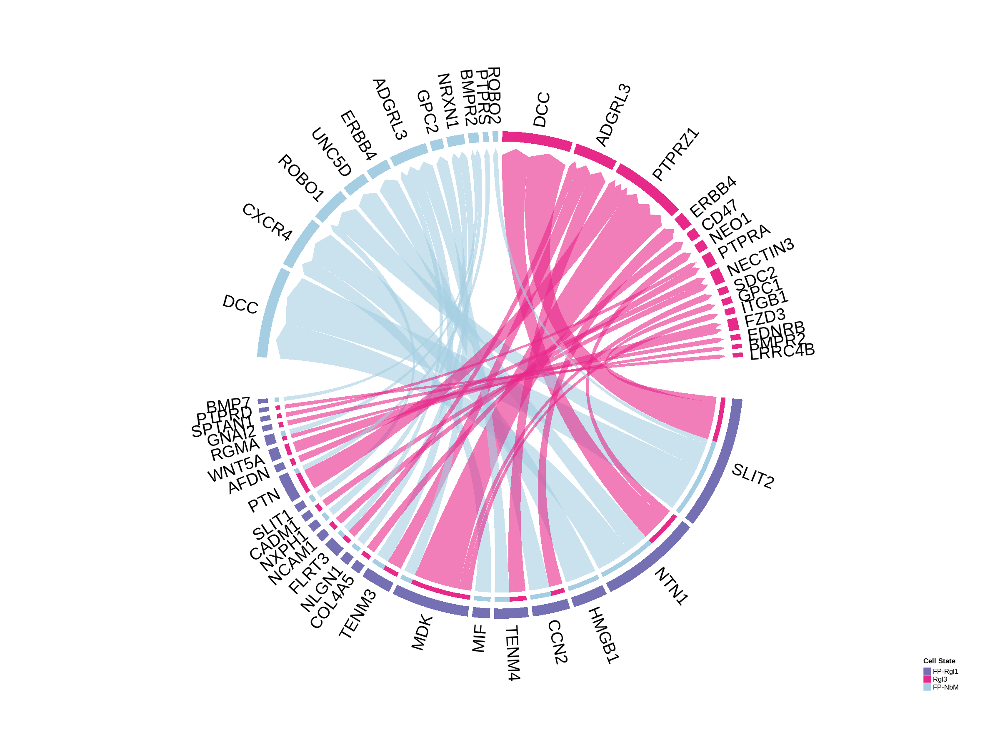

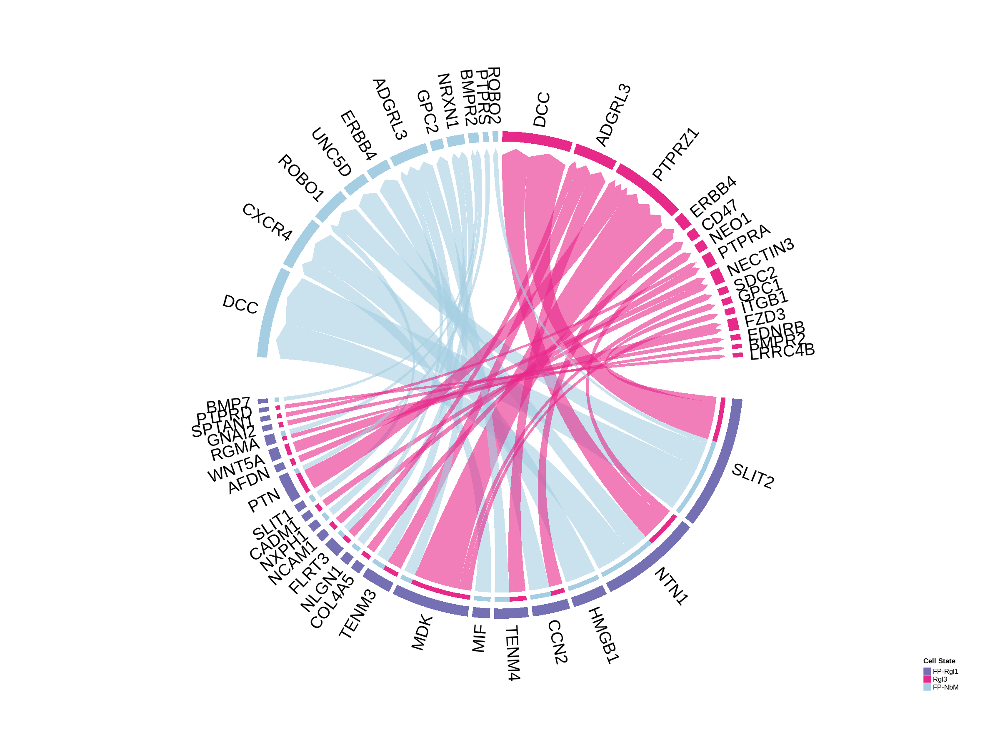

In [38]:
# RGL1 AS A SOURCE OF SIGNALS
df.net2 = communication_filtered[order(communication_filtered$prob, decreasing=TRUE), ]
df.net3 = df.net2[df.net2$source %in% c("FP-Rgl1") & (df.net2$receptor != "NTNG1"),]
df.net3 = df.net3[df.net3$ligand != df.net3$receptor,]
unique(df.net3$interaction_name)

# looking at signaling from Rgl3 to most interesting targets in the dopaminergic niche - subsetting needed for readability
false_lr = c("APP", "HSP90AA1", "CALM1", "RPSA", "NCL", "ADAM17")

df.net3 = df.net3[(!df.net3$ligand %in% false_lr) & (!df.net3$receptor %in% false_lr), ]

CINT = c("FP-NbM", "Rgl3")#"FP-DA0", "DA_ALDH1A1+", "DA_ALDH1A1-", 

df.net4 = df.net3[df.net3$target %in% CINT, ]

colors_of_interest <- humouse$color[humouse$human %in% c("FP-Rgl1", CINT)]
colors.use <- setNames(colors_of_interest, humouse$human[humouse$human %in% c("FP-Rgl1", CINT)])

unique_ligands <- unique(df.net4$ligand)
num_ligands <- length(unique_ligands)

set.seed(123)
ligand_colors <- as.data.frame(sample(colors(), num_ligands))

rownames(ligand_colors) <- unique_ligands

colnames(ligand_colors) = "value"
ligand_colors$ligand <- unique_ligands

df.net4 = dplyr::left_join(df.net4, ligand_colors, by=c("ligand"="ligand"))

print(unique(df.net4$ligand))
print(unique(df.net4$receptor))

netVisual_chord_gene_CUSTOM(cellchat, net=df.net4, lab.cex = 2, legend.pos.y = 30,  color.use=colors.use)

[1] SLIT2_ROBO1     SLIT2_DCC       SLIT2_ROBO2     NTN1_DCC       
 [5] HMGB1_CXCR4     CCN2_ERBB4      NCAM1_ROBO1     NTN1_UNC5D     
 [9] SLIT1_ROBO1     NLGN1_NRXN3     MDK_PTPRZ1      MDK_PTPRZ11    
[13] MK_PTPRZ        AFDN_NRXN3      SLIT2_GPC1      NXPH1_NRXN3    
[17] MDK_NCL         APP_DCC         TENM4_ADGRL3    NLGN1_NRXN1    
[21] CALM1_PTPRA     APP_RPSA        PPIA_BSG        MIF_CXCR4      
[25] TENM3_ADGRL3    NXPH1_NRXN1     MDK_GPC2        NTN1_NEO1      
[29] HSP90AA1_FGFR3  SHH_GPC5        CALM1_CACNA1C   APP_APLP1      
[33] PTPRS_LRRTM4    NCAM1_NCAM2     PTPRD_LRFN5     CALM1_KCNQ3    
[37] APP_APLP2       PTN_PTPRZ1      PTN_PTPRZ       PTN_PTPRZ11    
[41] COL4A5_CD47     RSPO2_ZNRF3     NCAM1_PTPRA     FLRT3_ADGRL3   
[45] PTN_NCL         HSP90AA1_LRP1   CALM1_KCNQ1     MDK_ITGA6      
[49] PTPRS_LRFN5     CADM1_NECTIN3   AFDN_NECTIN3    AFDN_EPHB2     
[53] MDK_SDC2        GNAI2_EDNRB     RGMA_BMPR2      WNT5A_FZD3     
[57] APP_GPC1        NCAM1_CACNA1C   MDK_ITGB1       MIF_ACKR3      
[61] WNT5A_FZD31     PTN_PTPRS       CALM1_GRM7      RGMA_NEO1      
[65] SLIT1_GPC1      SPTAN1_PTPRA    CCN2_LRP6       BCAN_NRCAM     
[69] RGMA_BMPR1B     ADAM17_ERBB4    SMS_SSR2        CALM3_CACNA1C  
[73] APLP2_PLXNA4    CALM1_INSR      MDK_LRP1        MDK_LRP11      
[77] BMP7_BMPR2      CALM1_PDE1A     PSAP_LRP1       APP_LRP6       
[81] HSP90B1_LRP1    WNT5A_FRZB      MDK_ITGA6_ITGB1 PTPRD_LRRC4B   
[85] CALM3_KCNQ3     NTN1_UNC5C      SLIT1_FLRT3     WNT5A_ANTXR1   
4811 Levels: TGFB1_TGFBR1_TGFBR2 TGFB2_TGFBR1_TGFBR2 ... ZP3_EGFR

 [1] "SLIT2" "NTN1"  "CCN2"  "NLGN1" "AFDN"  "NXPH1" "HMGB1" "TENM4" "MDK"  
[10] "TENM3" "PTPRS" "SLIT1" "MIF"   "PTN"   "FLRT3"
 [1] "DCC"    "ROBO2"  "ROBO1"  "ERBB4"  "NRXN3"  "CXCR4"  "NRXN1"  "ADGRL3"
 [9] "GPC2"   "LRRTM4" "PTPRS" 
DA_ALDH1A1+ DA_ALDH1A1-      FP-DA0 DA_ALDH1A1+ DA_ALDH1A1+ DA_ALDH1A1- 
  "#666666"   "#A6761D"   "#1B9E77"   "#666666"   "#666666"   "#A6761D" 
     FP-DA0 DA_ALDH1A1+ DA_ALDH1A1- DA_ALDH1A1-      FP-DA0 DA_ALDH1A1+ 
  "#1B9E77"   "#666666"   "#A6761D"   "#A6761D"   "#1B9E77"   "#666666" 
     FP-DA0 DA_ALDH1A1+ DA_ALDH1A1- DA_ALDH1A1+ DA_ALDH1A1+ DA_ALDH1A1- 
  "#1B9E77"   "#666666"   "#A6761D"   "#666666"   "#666666"   "#A6761D" 
     FP-DA0 DA_ALDH1A1- DA_ALDH1A1- DA_ALDH1A1-      FP-DA0 DA_ALDH1A1+ 
  "#1B9E77"   "#A6761D"   "#A6761D"   "#A6761D"   "#1B9E77"   "#666666" 
DA_ALDH1A1-      FP-DA0 DA_ALDH1A1+      FP-DA0      FP-DA0      FP-DA0 
  "#A6761D"   "#1B9E77"   "#666666"   "#1B9E77"   "#1B9E77"   "#1B9E77" 
     FP-DA0 DA_ALDH1A1- DA_ALDH

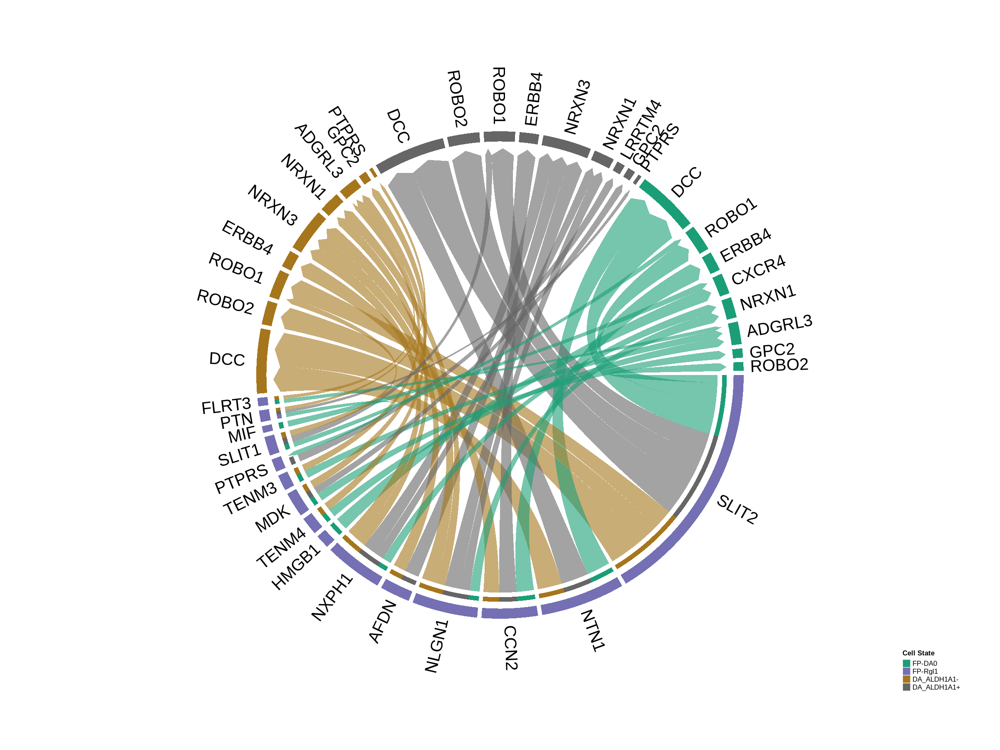

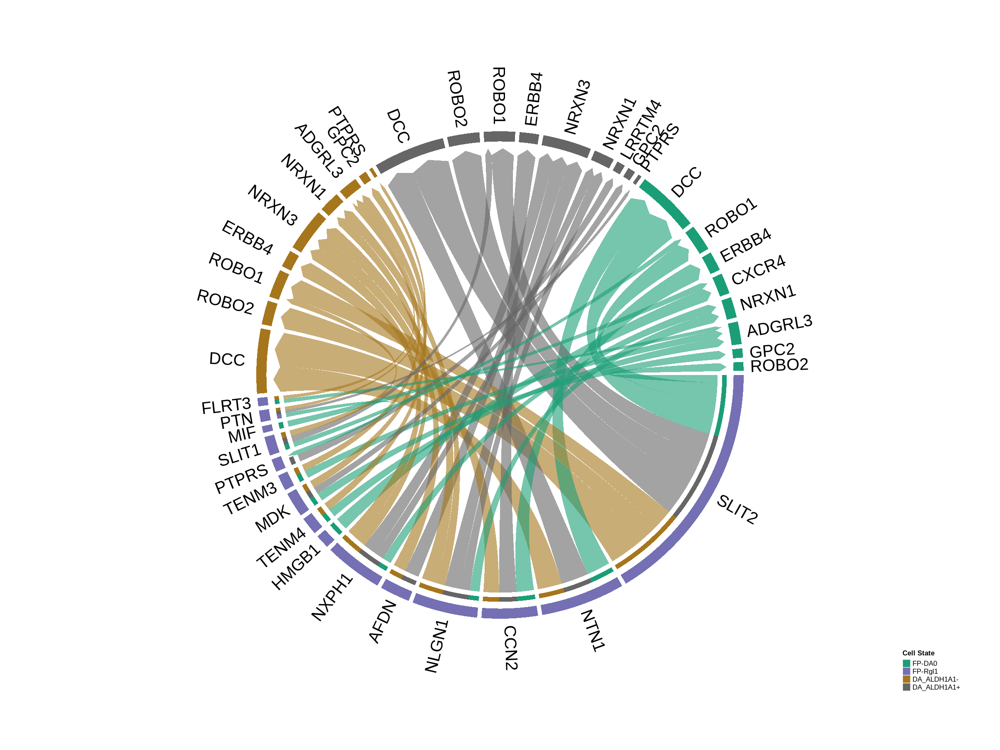

In [39]:
# RGL1 AS A SOURCE OF SIGNALS
df.net2 = communication_filtered[order(communication_filtered$prob, decreasing=TRUE), ]
df.net3 = df.net2[df.net2$source %in% c("FP-Rgl1") & (df.net2$receptor != "NTNG1"),]
df.net3 = df.net3[df.net3$ligand != df.net3$receptor,]
unique(df.net3$interaction_name)

# looking at signaling from Rgl3 to most interesting targets in the dopaminergic niche - subsetting needed for readability
false_lr = c("APP", "HSP90AA1", "CALM1", "RPSA", "NCL", "ADAM17")

df.net3 = df.net3[(!df.net3$ligand %in% false_lr) & (!df.net3$receptor %in% false_lr), ]

CINT = c("FP-DA0", "DA_ALDH1A1+", "DA_ALDH1A1-")

df.net4 = df.net3[df.net3$target %in% CINT, ]

colors_of_interest <- humouse$color[humouse$human %in% c("FP-Rgl1", CINT)]
colors.use <- setNames(colors_of_interest, humouse$human[humouse$human %in% c("FP-Rgl1", CINT)])

unique_ligands <- unique(df.net4$ligand)
num_ligands <- length(unique_ligands)

set.seed(123)
ligand_colors <- as.data.frame(sample(colors(), num_ligands))

rownames(ligand_colors) <- unique_ligands

colnames(ligand_colors) = "value"
ligand_colors$ligand <- unique_ligands

df.net4 = dplyr::left_join(df.net4, ligand_colors, by=c("ligand"="ligand"))

print(unique(df.net4$ligand))
print(unique(df.net4$receptor))

netVisual_chord_gene_CUSTOM(cellchat, net=df.net4, lab.cex = 2, legend.pos.y = 30,  color.use=colors.use)